<a href="https://colab.research.google.com/github/balavignesh-ks/Cloud-Machine-Learning/blob/main/Group_7_Diabetes_Prediction_Machine_Learning_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1><b>Diabetes Prediction Machine Learning Project - Group 7</b></h1>



---



Balavignesh Kunkulagunta Sanghameswar - 22220445 <br>
Ashutosh Ramesh Jadhav - 22183868 <br>
Manvendar Singh Sekhawat - 22212051 <br>


# Importing the libraries

In [ ]:
# Import libraries
import numpy as np # for linear algebra
import pandas as pd # for data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # for data visualization
import matplotlib.pyplot as plt # to plot data visualization charts
import statsmodels.api as sm
from collections import Counter

# Modeling Libraries
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, mean_squared_error, r2_score, roc_auc_score, roc_curve, classification_report
from sklearn.preprocessing import QuantileTransformer, scale, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve, train_test_split, KFold
from sklearn.svm import SVC
from sklearn.utils import parallel_backend
from imblearn.combine import SMOTEENN
from concurrent.futures import ThreadPoolExecutor

import warnings
import os

warnings.simplefilter(action='ignore')
sns.set()
plt.style.use("ggplot")
%matplotlib inline

# Dataset 1

## Reading Dataset

In [ ]:
data1 = pd.read_csv('diabetes_prediction_dataset.csv')
data1.info()

## Data Cleaning

Checking each column and displaying unique values

In [ ]:
# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Checking each column value counts

In [ ]:
# Iterate through each column and display value counts
for column in data1.columns:
    print(f"Column: {column}")
    print(data1[column].value_counts())
    print()

Checking related columns where gender is Fermale or Animal

In [ ]:
# Check rows where 'gender' is 'Fermale' or 'Animal' and display related columns
related_columns = ['hypertension', 'heart_disease', 'smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'age','diabetes', 'gender']
related_data = data1[(data1['gender'] == 'Fermale') | (data1['gender'] == 'Animal')][related_columns]
print(related_data)

Since the Fermale looks like an obvious typing mistake. We are changing it to Female.

In [ ]:
# Replace 'Fermale' with 'Female' in the 'gender' column
data1['gender'] = data1['gender'].replace('Fermale', 'Female')

# Check the unique values in the 'gender' column to confirm the change
print(data1['gender'].value_counts())

We'll only focus on Male and Female genders. Other and Animal Genders are dropped.

In [ ]:
# Drop rows with 'Other' and 'Animal' values in the 'gender' column
data1 = data1[data1['gender'] != 'Other']
data1 = data1[data1['gender'] != 'Animal']

# Check the updated value counts in the 'gender' column
print(data1['gender'].value_counts())

Checking related columns where age is less than 0 and greater than 100

In [ ]:
# Check rows where 'age' is less than 0 and greater than 100 and display related columns
related_columns = ['hypertension', 'heart_disease', 'smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'gender','diabetes', 'age']
related_data = data1[(data1['age'] <= 0) | (data1['age'] >= 100) ][related_columns]
print(related_data)

Dropping the rows where age is less than 0 and greater than 100

In [ ]:
# Drop rows with negative values and values greater than 100 in the 'age' column
data1 = data1[(data1['age'] >= 0) & (data1['age'] <= 100)]

# Check the updated value counts in the 'age' column
print(data1['age'].value_counts())

Checking related columns where diabetes is -1 or Nan

In [ ]:
# Check rows where 'diabetes' is -1 or NaN and display related columns
related_columns = ['age', 'hypertension', 'heart_disease', 'smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'gender', 'diabetes']
related_data = data1[(data1['diabetes'] == -1) | data1['diabetes'].isna()][related_columns]
print(related_data)

Imputing the -1 in diabetes with most frequent value in that column

In [ ]:
mode_value = data1['diabetes'].mode()[0]
data1['diabetes'] = data1['diabetes'].replace(-1, mode_value)

Countplots

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x=data1['diabetes'],data=data1)
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x=data1['age'],data=data1)
plt.show()

Changing age to integer

In [ ]:
data1['age'] = data1['age'].astype(int)

In [ ]:
data1['age'].unique()

Removing Age = 0

In [ ]:
data1 = data1[data1['age']!=0]

Checking smoking history for age less than or equal to 5

In [ ]:
sns.set(style="whitegrid")
sns.catplot(x="age", y="smoking_history", data=data1.loc[data1['age'] <=5])
plt.show()

Removing the rows where age less than 5 has smoking history (ever or current)

In [ ]:
data1 = data1[~((data1['age'] < 5) & data1['smoking_history'].isin(['ever', 'current']))]

In [ ]:
sns.set(style="whitegrid")
sns.catplot(x="age", y="smoking_history", data=data1.loc[data1['age'] <=5])
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x=data1['gender'],data=data1)
plt.show()

## Numerical Columns Distribution Visulization

In [ ]:
# Visualize the distribution of each numerical column
sns.set(style="whitegrid")

# Plot histograms of numerical columns
numerical_cols = data1.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data1[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

## Histplots

In [ ]:
sns.histplot(data=data1,x='bmi',hue='diabetes')
plt.show()

In [ ]:
sns.histplot(data=data1,x='gender',hue='diabetes')
plt.show()

In [ ]:
sns.histplot(data=data1,x='smoking_history',hue='diabetes')
plt.show()

In [ ]:
sns.histplot(data=data1,x='hypertension',hue='diabetes')
plt.show()

In [ ]:
sns.histplot(data=data1,x='heart_disease',hue='diabetes')
plt.show()

## kdeplots

In [ ]:
sns.kdeplot(data=data1,x='HbA1c_level',hue='diabetes')
plt.show()

In [ ]:
data1['HbA1c_level'].value_counts()

## Outlier Detection with box plots and Removal

In [ ]:
plt.boxplot(data1['HbA1c_level'])
plt.show()

In [ ]:
mean = data1['HbA1c_level'].mean()
std  = data1['HbA1c_level'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data1 = data1[(data1['HbA1c_level'] >= lower_bound)
                & (data1['HbA1c_level'] <= upper_bound)]

In [ ]:
plt.boxplot(data1['blood_glucose_level'])
plt.show()

In [ ]:
mean = data1['blood_glucose_level'].mean()
std  = data1['blood_glucose_level'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data1 = data1[(data1['blood_glucose_level'] >= lower_bound)
                & (data1['blood_glucose_level'] <= upper_bound)]

In [ ]:
plt.boxplot(data1['bmi'])
plt.show()

In [ ]:
mean = data1['bmi'].mean()
std  = data1['bmi'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data1 = data1[(data1['bmi'] >= lower_bound)
                & (data1['bmi'] <= upper_bound)]

In [ ]:
data1['diabetes'].value_counts()

## Checking Nulls and Duplicates

Checking Nulls in Dataset 1

In [ ]:
data1.isnull().sum()

## One Hot Encoding for Categorical Columns

In [ ]:
data1 = pd.get_dummies(data=data1, drop_first=True)
data1.head()

Replacing False to 0 and True to 1

In [ ]:
change_col =  ['gender_Male','smoking_history_ever','smoking_history_former','smoking_history_never','smoking_history_not current','smoking_history_current']
for col in change_col:
    data1[col] = data1[col].replace(False, 0)
    data1[col] = data1[col].replace(True, 1)
data1.head()

## Correlation matrix

In [ ]:
# Calculate correlation matrix
corr_matrix = data1.corr()

# Visualize correlation matrix (optional)
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

# Identify columns with high correlation to the target column
target_corr = corr_matrix['diabetes'].abs().sort_values(ascending=False)
print(target_corr)

# Dataset 2

Reading Dataset

In [ ]:
data2 = pd.read_csv("diabetes_binary_health_indicators_BRFSS2015.csv")
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_binary       253678 non-null  float64
 1   HighBP                253680 non-null  int64  
 2   HighChol              253680 non-null  int64  
 3   CholCheck             253680 non-null  int64  
 4   BMI                   253680 non-null  int64  
 5   Smoker                253680 non-null  int64  
 6   Stroke                253680 non-null  int64  
 7   HeartDiseaseorAttack  253680 non-null  int64  
 8   PhysActivity          253680 non-null  int64  
 9   Fruits                253680 non-null  int64  
 10  HvyAlcoholConsump     253680 non-null  int64  
 11  AnyHealthcare         253680 non-null  int64  
 12  GenHlth               253680 non-null  int64  
 13  MentHlth              253680 non-null  int64  
 14  PhysHlth              253680 non-null  int64  
 15  

In [ ]:
data2.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1,1,1,40,1,0,0,0,0,0,1,5,18,15,1,0,9.0,4,3
1,0.0,0,0,0,25,1,0,0,1,0,0,0,3,0,0,0,0,7.0,6,1
2,0.0,1,1,1,28,0,0,0,0,1,0,1,5,30,30,1,0,9.0,4,8
3,0.0,1,0,1,27,0,0,0,1,1,0,1,2,0,0,0,0,11.0,3,6
4,0.0,1,1,1,24,0,0,0,1,1,0,1,2,3,0,0,0,11.0,5,4


In [ ]:
data2.describe()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,253678.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253675.000000,253680.000000,253680.000000
mean,0.139338,0.429001,0.424121,0.962670,28.382364,0.443169,0.040571,0.094186,0.756544,0.634256,0.056197,0.951053,2.511392,3.184772,4.242081,0.168224,0.440342,8.032069,5.050434,6.053875
std,0.346357,0.494934,0.494210,0.189571,6.608694,0.496761,0.197294,0.292087,0.429169,0.481639,0.230302,0.215759,1.068477,7.412847,8.717951,0.374066,0.496429,3.054558,0.985774,2.071148
min,-1.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-7.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,0.000000,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,2.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


Correlation Matrix

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5]),
 [Text(0, 0.5, 'Diabetes_binary'),
  Text(0, 1.5, 'HighBP'),
  Text(0, 2.5, 'HighChol'),
  Text(0, 3.5, 'CholCheck'),
  Text(0, 4.5, 'BMI'),
  Text(0, 5.5, 'Smoker'),
  Text(0, 6.5, 'Stroke'),
  Text(0, 7.5, 'HeartDiseaseorAttack'),
  Text(0, 8.5, 'PhysActivity'),
  Text(0, 9.5, 'Fruits'),
  Text(0, 10.5, 'HvyAlcoholConsump'),
  Text(0, 11.5, 'AnyHealthcare'),
  Text(0, 12.5, 'GenHlth'),
  Text(0, 13.5, 'MentHlth'),
  Text(0, 14.5, 'PhysHlth'),
  Text(0, 15.5, 'DiffWalk'),
  Text(0, 16.5, 'Sex'),
  Text(0, 17.5, 'Age'),
  Text(0, 18.5, 'Education'),
  Text(0, 19.5, 'Income')])

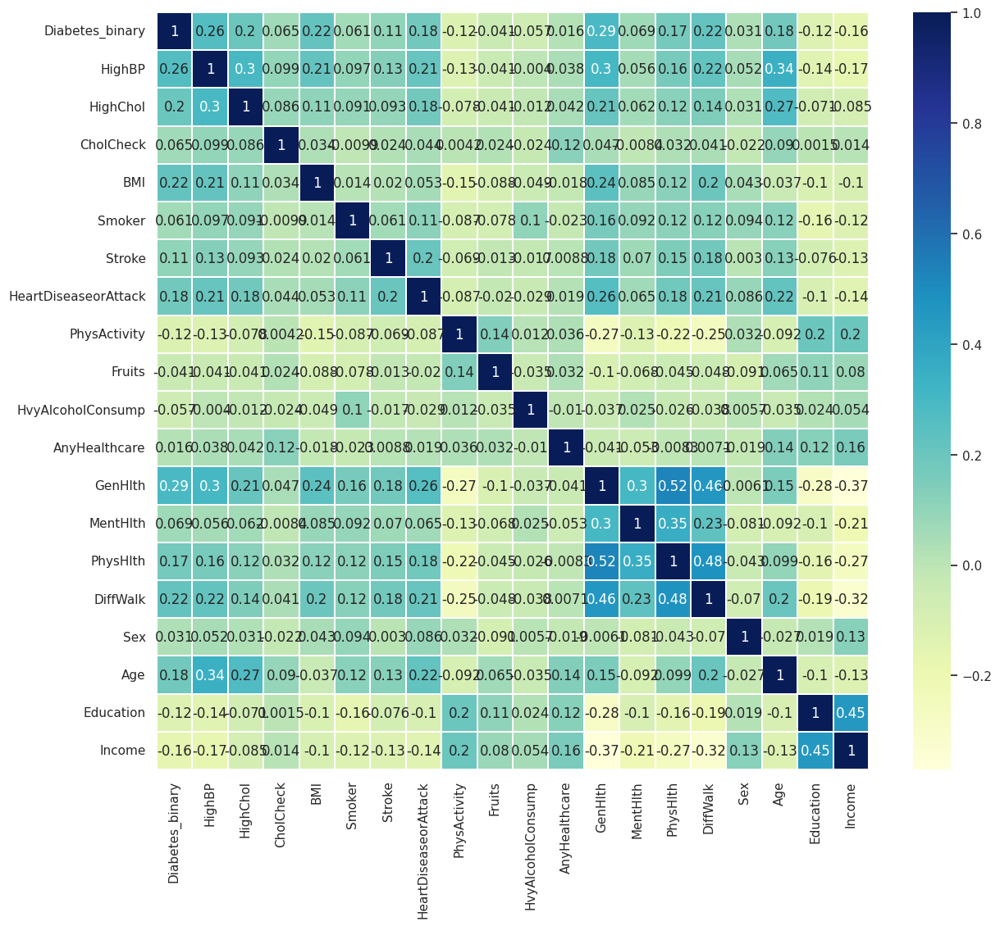

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(data2.corr(), linewidths=.1, cmap="YlGnBu", annot=True)
plt.yticks(rotation=0)

Checking each column and displaying unique values

In [ ]:
# Iterate through each column and display unique values
for column in data2.columns:
    unique_values = data2[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Diabetes_binary
[ 0.  1.  2. -1. nan]

Column: HighBP
[1 0]

Column: HighChol
[1 0]

Column: CholCheck
[1 0]

Column: BMI
[40 25 28 27 24 30 34 26 33 21 23 22 38 32 37 31 29 20 35 45 39 19 47 18
 36 43 55 49 42 17 16 41 44 50 59 48 52 46 54 57 53 14 15 51 58 63 61 56
 74 62 64 66 73 85 60 67 65 70 82 79 92 68 72 88 96 13 81 71 75 12 77 69
 76 87 89 84 95 98 91 86 83 80 90 78]

Column: Smoker
[1 0]

Column: Stroke
[0 1]

Column: HeartDiseaseorAttack
[0 1]

Column: PhysActivity
[0 1]

Column: Fruits
[0 1]

Column: HvyAlcoholConsump
[0 1]

Column: AnyHealthcare
[1 0]

Column: GenHlth
[5 3 2 4 1]

Column: MentHlth
[18  0 30  3  5 15 10  6 20  2 25  1  4  7  8 21 14 26 29 16 28 11 12 24
 17 13 27 19 22  9 23]

Column: PhysHlth
[15  0 30  2 14 28  7 20  3 10  1  5 17  4 19  6 12 25 27 21 22  8 29 24
  9 16 18 23 13 26 11]

Column: DiffWalk
[1 0]

Column: Sex
[0 1]

Column: Age
[ 9.  7. 11. 10.  8. 13.  4.  6.  2. 12.  5.  1.  3. -1. -3. -6. -7. -2.
 nan]

Column: Education
[4 6 3 5 2

Checking each column value counts

In [ ]:
# Iterate through each column and display value counts
for column in data2.columns:
    print(f"Column: {column}")
    print(data2[column].value_counts())
    print()

Column: Diabetes_binary
Diabetes_binary
 0.0    218327
 1.0     35346
-1.0         3
 2.0         2
Name: count, dtype: int64

Column: HighBP
HighBP
0    144851
1    108829
Name: count, dtype: int64

Column: HighChol
HighChol
0    146089
1    107591
Name: count, dtype: int64

Column: CholCheck
CholCheck
1    244210
0      9470
Name: count, dtype: int64

Column: BMI
BMI
27    24606
26    20562
24    19550
25    17146
28    16545
      ...  
85        1
91        1
86        1
90        1
78        1
Name: count, Length: 84, dtype: int64

Column: Smoker
Smoker
0    141257
1    112423
Name: count, dtype: int64

Column: Stroke
Stroke
0    243388
1     10292
Name: count, dtype: int64

Column: HeartDiseaseorAttack
HeartDiseaseorAttack
0    229787
1     23893
Name: count, dtype: int64

Column: PhysActivity
PhysActivity
1    191920
0     61760
Name: count, dtype: int64

Column: Fruits
Fruits
1    160898
0     92782
Name: count, dtype: int64

Column: HvyAlcoholConsump
HvyAlcoholConsump
0    239

## Cleaning the dataset

Checking related columns where age is less than 0 and greater than 100

In [ ]:
# Check rows where 'age' is less than 0 and greater than 120 and display related columns
related_columns = ['HighBP' , 'HighChol' , 'CholCheck' , 'BMI', 'Smoker' , 'Stroke' , 'HeartDiseaseorAttack' , 'PhysActivity' ,'Fruits' ,'HvyAlcoholConsump' ,'AnyHealthcare' ,'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Education', 'Age','Diabetes_binary', 'Income']
related_data = data2[(data2['Age'] <= 0) | (data2['Age'] >= 100) ][related_columns]
print(related_data)

       HighBP  HighChol  CholCheck  BMI  Smoker  Stroke  HeartDiseaseorAttack  \
1995        0         0          1   39       0       0                     0   
3367        0         0          1   28       0       0                     0   
7958        0         0          1   32       0       0                     0   
12836       1         0          1   36       1       0                     0   
16430       0         0          1   20       0       0                     0   

       PhysActivity  Fruits  HvyAlcoholConsump  AnyHealthcare  GenHlth  \
1995              1       0                  0              1        1   
3367              1       1                  0              1        1   
7958              1       1                  0              1        2   
12836             1       0                  0              1        4   
16430             0       1                  0              0        2   

       MentHlth  PhysHlth  DiffWalk  Sex  Education  Age  Diabetes_b

Dropping the rows where age is less than 0 and greater than 100

In [ ]:
# Drop rows with negative values and values greater than 100 in the 'Age' column
data2 = data2[(data2['Age'] >= 0) & (data2['Age'] <= 100)]

# Check the updated value counts in the 'age' column
print(data2['Age'].value_counts())

Age
9.0     33244
10.0    32194
8.0     30832
7.0     26313
11.0    23533
6.0     19818
13.0    17363
5.0     16156
12.0    15980
4.0     13823
3.0     11119
2.0      7597
1.0      5698
Name: count, dtype: int64


Checking related columns where diabetes is less than 0 or Nan or greater than 1

In [ ]:
# Check rows where 'diabetes' is less than 0 or NaN or greater than 1and display related columns
related_columns = ['HighBP' , 'HighChol' , 'CholCheck' , 'BMI', 'Smoker' , 'Stroke' , 'HeartDiseaseorAttack' , 'PhysActivity' ,'Fruits' ,'HvyAlcoholConsump' ,'AnyHealthcare' ,'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Education', 'Age','Diabetes_binary', 'Income']
related_data = data2[(data2['Diabetes_binary'] < 0) | (data2['Diabetes_binary'] > 1) | data2['Diabetes_binary'].isna()][related_columns]
print(related_data)

Empty DataFrame
Columns: [HighBP, HighChol, CholCheck, BMI, Smoker, Stroke, HeartDiseaseorAttack, PhysActivity, Fruits, HvyAlcoholConsump, AnyHealthcare, GenHlth, MentHlth, PhysHlth, DiffWalk, Sex, Education, Age, Diabetes_binary, Income]
Index: []


In [ ]:
data2.isnull().sum()

Diabetes_binary         0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
HvyAlcoholConsump       0
AnyHealthcare           0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

## Numerical Column Distribution Visualization

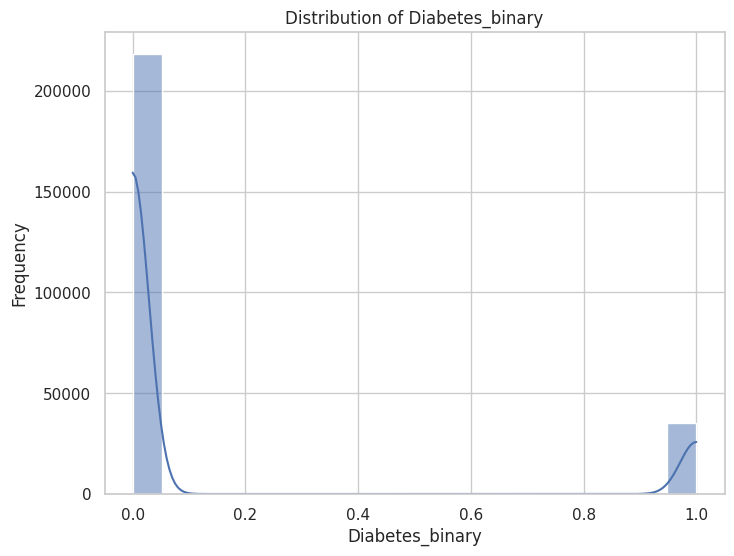

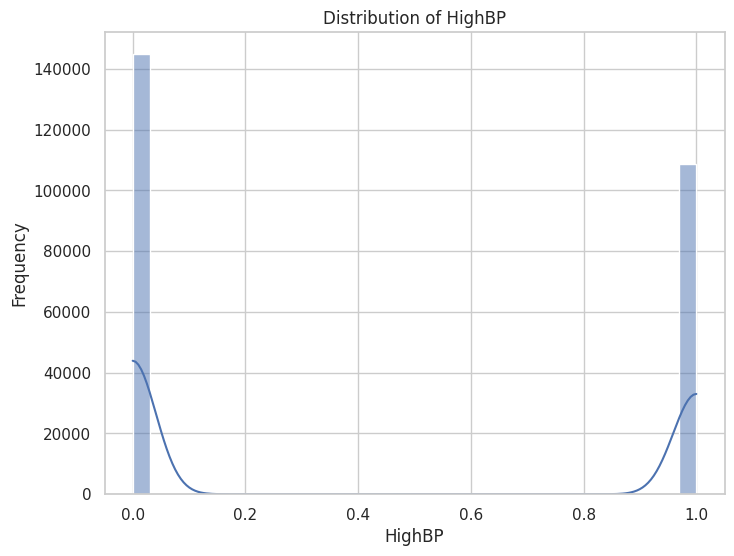

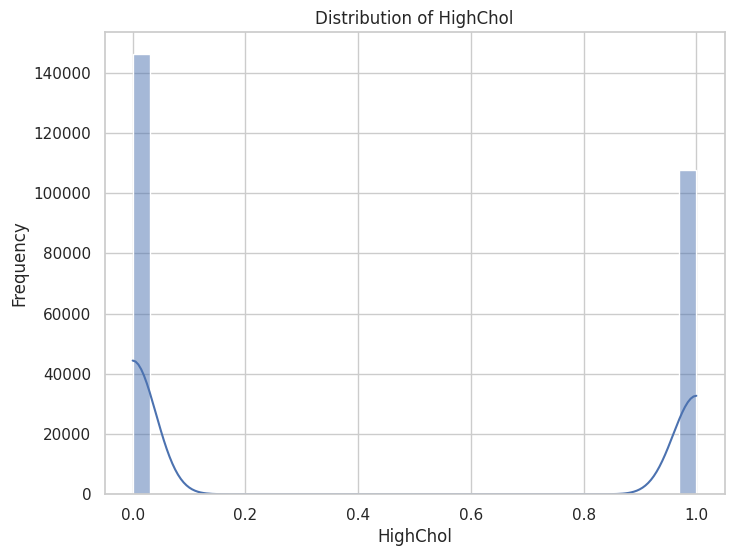

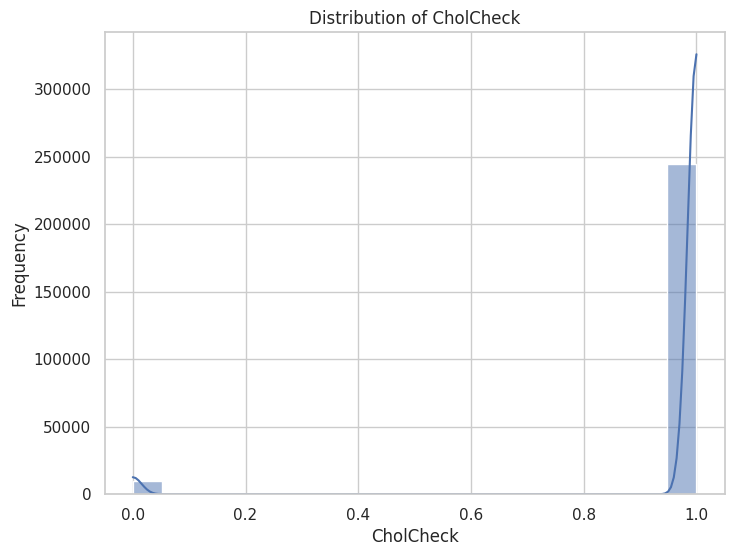

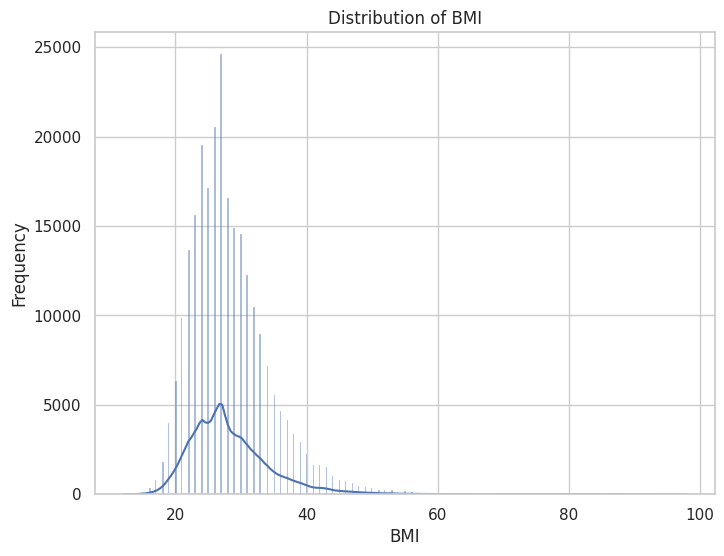

...

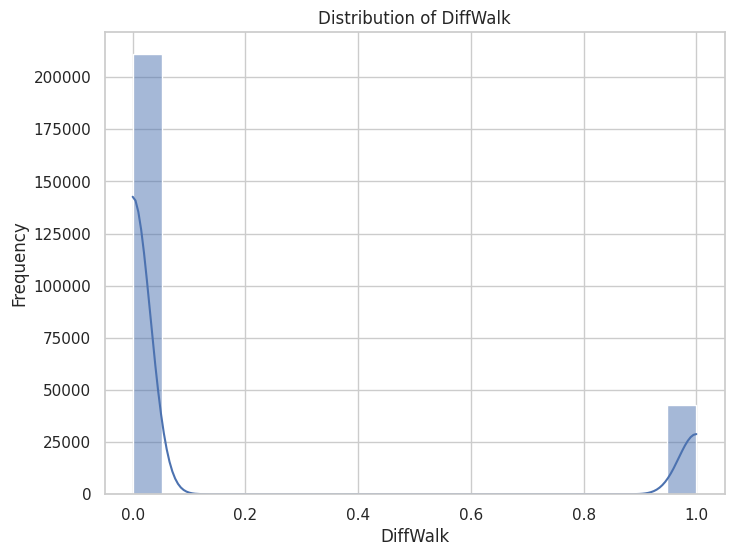

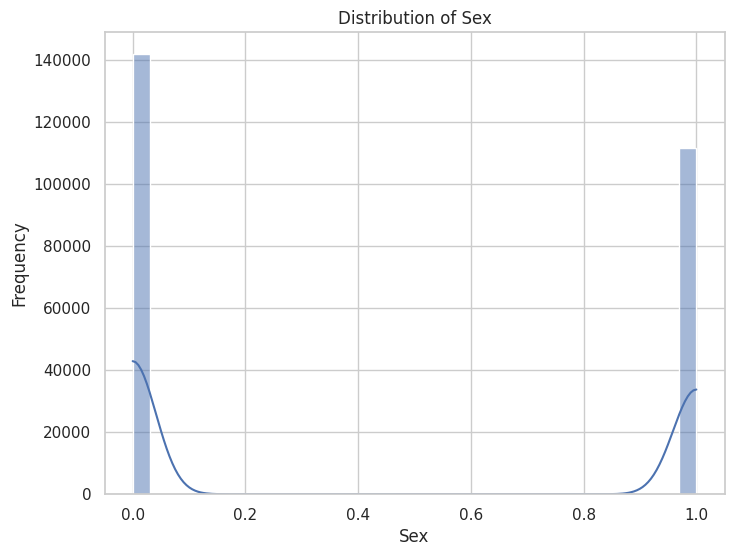

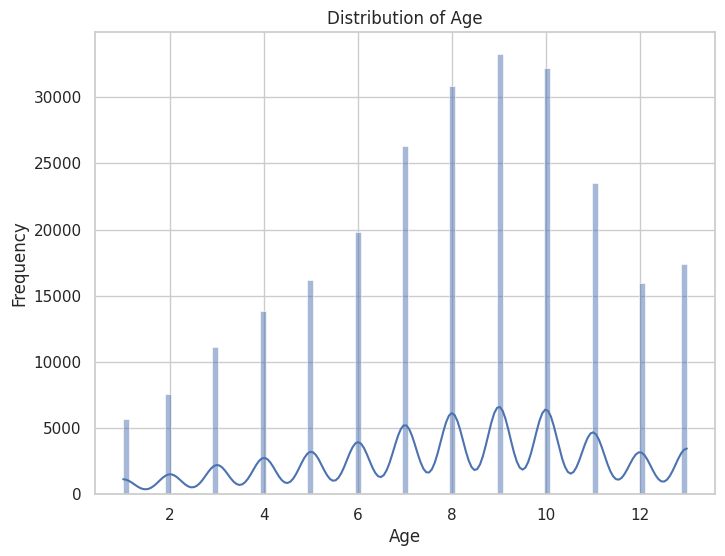

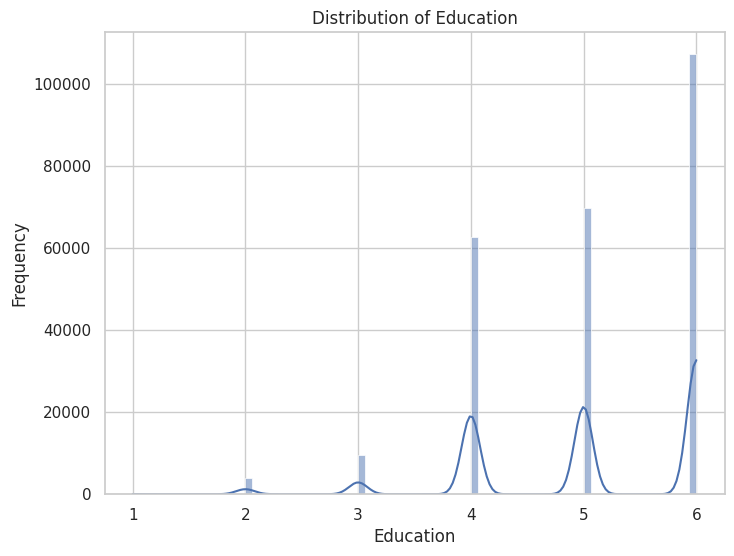

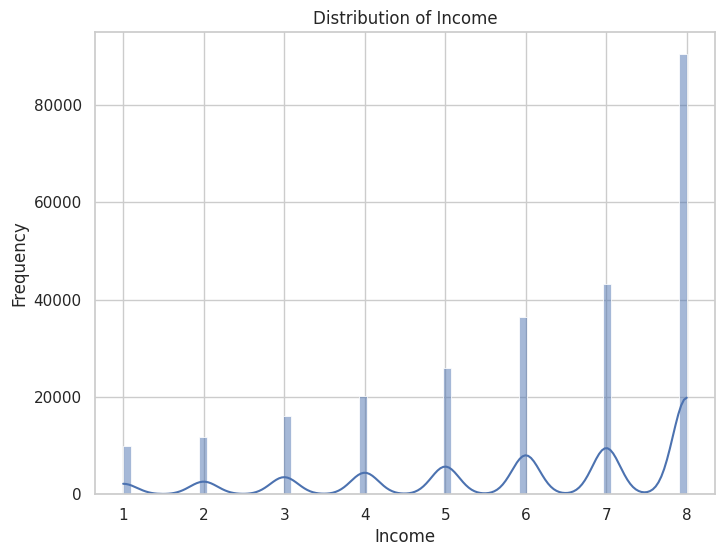

In [ ]:
# Visualize the distribution of each numerical column
sns.set(style="whitegrid")

# Plot histograms of numerical columns
numerical_cols = data2.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data2[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

## Outlier Detection with box plots and Removal

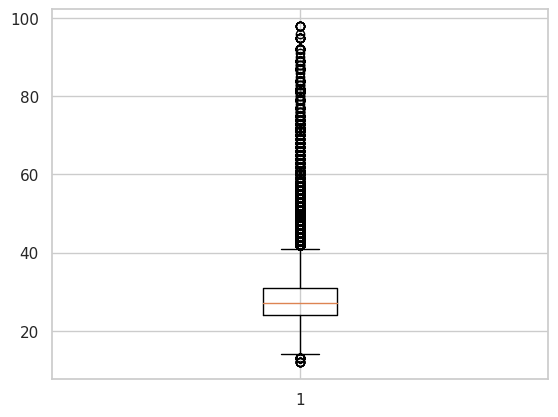

In [ ]:
plt.boxplot(data2['BMI'])
plt.show()

In [ ]:
mean = data2['BMI'].mean()
std  = data2['BMI'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data2 = data2[(data2['BMI'] >= lower_bound)
                & (data2['BMI'] <= upper_bound)]

Lower Bound : 15.164997861981059
Upper Bound : 41.599759499945854


# Dataset 3

Reading Dataset

In [ ]:
data3 = pd.read_csv("diabetes_binary_5050split_health_indicators_BRFSS2015.csv")
data3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       70688 non-null  float64
 1   HighBP                70692 non-null  int64  
 2   HighChol              70692 non-null  int64  
 3   CholCheck             70692 non-null  int64  
 4   BMI                   70692 non-null  int64  
 5   Smoker                70692 non-null  int64  
 6   HeartDiseaseorAttack  70692 non-null  int64  
 7   PhysActivity          70692 non-null  int64  
 8   Veggies               70692 non-null  int64  
 9   HvyAlcoholConsump     70692 non-null  int64  
 10  AnyHealthcare         70692 non-null  int64  
 11  NoDocbcCost           70692 non-null  int64  
 12  GenHlth               70692 non-null  int64  
 13  MentHlth              70692 non-null  int64  
 14  PhysHlth              70692 non-null  int64  
 15  DiffWalk           

In [ ]:
data3.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1,0,1,26,0,0,1,1,0,1,0,3,5,30,0,1,4.0,6,8
1,0.0,1,1,1,26,1,0,0,0,0,1,0,3,0,0,0,1,12.0,6,8
2,0.0,0,0,1,26,0,0,1,1,0,1,0,1,0,10,0,1,13.0,6,8
3,0.0,1,1,1,28,1,0,1,1,0,1,0,3,0,3,0,1,11.0,6,8
4,0.0,0,0,1,29,1,0,1,1,0,1,0,2,0,0,0,0,8.0,5,8


In [ ]:
data3.describe()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,70688.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70690.000000,70692.000000,70692.000000
mean,0.499973,0.563458,0.525703,0.975259,29.856985,0.475273,0.147810,0.703036,0.788774,0.042721,0.954960,0.093914,2.837082,3.752037,5.810417,0.252730,0.456997,8.597652,4.920953,5.698311
std,0.500087,0.495960,0.499342,0.155336,7.113954,0.499392,0.354914,0.456924,0.408181,0.202228,0.207394,0.291712,1.113565,8.155627,10.062261,0.434581,0.498151,4.269213,1.029081,2.175196
min,-1.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-12.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,25.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,7.000000,4.000000,4.000000
50%,0.050000,1.000000,1.000000,1.000000,29.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,9.000000,5.000000,6.000000
75%,1.000000,1.000000,1.000000,1.000000,33.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,4.000000,2.000000,6.000000,1.000000,1.000000,11.000000,6.000000,8.000000
max,2.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,800.000000,6.000000,8.000000


Checking each column and displaying unique values

In [ ]:
# Iterate through each column and display unique values
for column in data3.columns:
    unique_values = data3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Diabetes_binary
[ 0.   0.1 -1.   nan  1.   2. ]

Column: HighBP
[1 0]

Column: HighChol
[0 1]

Column: CholCheck
[1 0]

Column: BMI
[26 28 29 18 31 32 27 24 21 58 30 20 22 38 40 25 36 47 19 37 41 23 34 35
 42 17 33 44 15 52 69 56 45 39 92 53 98 50 46 79 48 16 63 72 54 49 68 43
 84 73 76 55 51 75 57 60 12 77 82 67 71 61 14 81 59 86 13 87 65 95 89 62
 64 66 85 70 83 80 78 74]

Column: Smoker
[0 1]

Column: HeartDiseaseorAttack
[0 1]

Column: PhysActivity
[1 0]

Column: Veggies
[1 0]

Column: HvyAlcoholConsump
[0 1]

Column: AnyHealthcare
[1 0]

Column: NoDocbcCost
[0 1]

Column: GenHlth
[3 1 2 4 5]

Column: MentHlth
[ 5  0  7  3  4  2 30 20  1 15 10 25 14 28  6 29 26 12 16 22 13  8  9 21
 18 17 27 24 23 11 19]

Column: PhysHlth
[30  0 10  3  6  4 15  1  2 14  7 25 21 20  5  8 22 23 29 12 18 28 26 24
 27 11 13 16 17  9 19]

Column: DiffWalk
[0 1]

Column: Sex
[1 0]

Column: Age
[  4.  12.  13.  11.   8.   1.   6.   3.   7.  10.   9.   5.   2. 300.
 -12. 800. -11.  nan -10.  -5.]



Checking each column value counts

In [ ]:
# Iterate through each column and display value counts
for column in data3.columns:
    print(f"Column: {column}")
    print(data3[column].value_counts())
    print()

Column: Diabetes_binary
Diabetes_binary
 0.0    35342
 1.0    35342
-1.0        2
 0.1        1
 2.0        1
Name: count, dtype: int64

Column: HighBP
HighBP
1    39832
0    30860
Name: count, dtype: int64

Column: HighChol
HighChol
1    37163
0    33529
Name: count, dtype: int64

Column: CholCheck
CholCheck
1    68943
0     1749
Name: count, dtype: int64

Column: BMI
BMI
27    6327
26    4975
28    4583
24    4392
30    4344
      ... 
85       1
83       1
80       1
78       1
74       1
Name: count, Length: 80, dtype: int64

Column: Smoker
Smoker
0    37094
1    33598
Name: count, dtype: int64

Column: HeartDiseaseorAttack
HeartDiseaseorAttack
0    60243
1    10449
Name: count, dtype: int64

Column: PhysActivity
PhysActivity
1    49699
0    20993
Name: count, dtype: int64

Column: Veggies
Veggies
1    55760
0    14932
Name: count, dtype: int64

Column: HvyAlcoholConsump
HvyAlcoholConsump
0    67672
1     3020
Name: count, dtype: int64

Column: AnyHealthcare
AnyHealthcare
1    6750

## Cleaning the dataset

Checking related columns where age is less than 0 and greater than 100

In [ ]:
# Check rows where 'age' is less than 0 and greater than 120 and display related columns
related_columns = ['HighBP' , 'HighChol' , 'CholCheck' , 'BMI', 'Smoker' , 'NoDocbcCost' , 'HeartDiseaseorAttack' , 'PhysActivity' ,'Veggies' ,'HvyAlcoholConsump' ,'AnyHealthcare' ,'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Education', 'Age','Diabetes_binary', 'Income']
related_data = data3[(data3['Age'] <= 0) | (data3['Age'] >= 100) ][related_columns]
print(related_data)

       HighBP  HighChol  CholCheck  BMI  Smoker  NoDocbcCost  \
495         0         0          1   23       0            0   
1270        1         1          1   25       1            1   
1704        1         0          1   36       0            0   
3935        1         0          1   34       1            0   
5295        0         0          1   26       0            0   
50339       1         1          1   26       0            0   
54271       0         0          1   24       0            0   
57640       1         1          1   31       1            0   

       HeartDiseaseorAttack  PhysActivity  Veggies  HvyAlcoholConsump  \
495                       0             1        1                  0   
1270                      0             1        1                  0   
1704                      0             1        1                  0   
3935                      0             1        1                  0   
5295                      0             0        0        

Dropping the rows where age is less than 0 and greater than 100

In [ ]:
# Drop rows with negative values and values greater than 100 in the 'Age' column
data3 = data3[(data3['Age'] >= 0) & (data3['Age'] <= 100)]

# Check the updated value counts in the 'age' column
print(data3['Age'].value_counts())

Age
10.0    10855
9.0     10111
8.0      8602
11.0     8043
7.0      6872
13.0     5426
12.0     5390
6.0      4648
5.0      3519
4.0      2793
3.0      2048
2.0      1396
1.0       979
Name: count, dtype: int64


In [ ]:
# Iterate through each column and display unique values
for column in data3.columns:
    unique_values = data3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Diabetes_binary
[0. 1.]

Column: HighBP
[1 0]

Column: HighChol
[0 1]

Column: CholCheck
[1 0]

Column: BMI
[26 28 29 18 31 32 27 24 21 58 30 20 22 38 40 25 36 47 19 37 41 23 34 35
 42 17 33 44 15 52 69 56 45 39 92 53 98 50 46 79 48 16 63 72 54 49 68 43
 84 73 76 55 51 75 57 60 12 77 82 67 71 61 14 81 59 86 13 87 65 95 89 62
 64 66 85 70 83 80 78 74]

Column: Smoker
[0 1]

Column: HeartDiseaseorAttack
[0 1]

Column: PhysActivity
[1 0]

Column: Veggies
[1 0]

Column: HvyAlcoholConsump
[0 1]

Column: AnyHealthcare
[1 0]

Column: NoDocbcCost
[0 1]

Column: GenHlth
[3 1 2 4 5]

Column: MentHlth
[ 5  0  7  3  4  2 30 20  1 15 10 25 14 28  6 29 26 12 16 22 13  8  9 21
 18 17 27 24 23 11 19]

Column: PhysHlth
[30  0 10  3  6  4 15  1  2 14  7 25 21 20  5  8 22 23 29 12 18 28 26 24
 27 11 13 16 17  9 19]

Column: DiffWalk
[0 1]

Column: Sex
[1 0]

Column: Age
[ 4. 12. 13. 11.  8.  1.  6.  3.  7. 10.  9.  5.  2.]

Column: Education
[6 5 4 3 2 1]

Column: Income
[8 7 6 3 4 1 5 2]



## Numerical Column Distribution Visualization

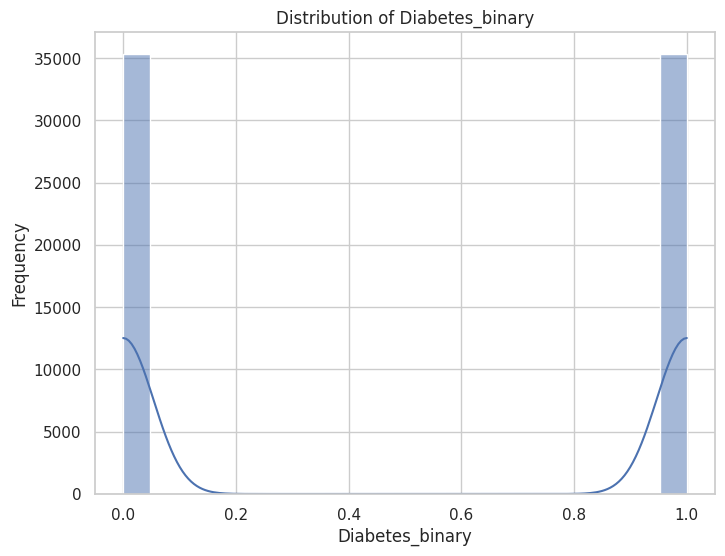

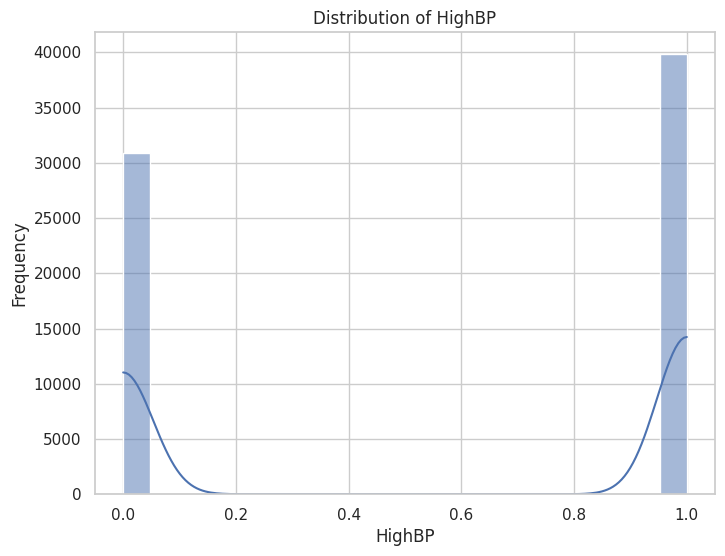

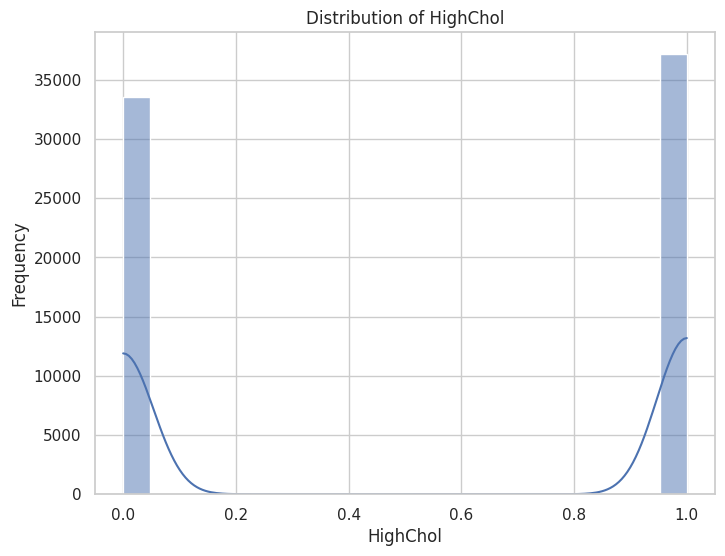

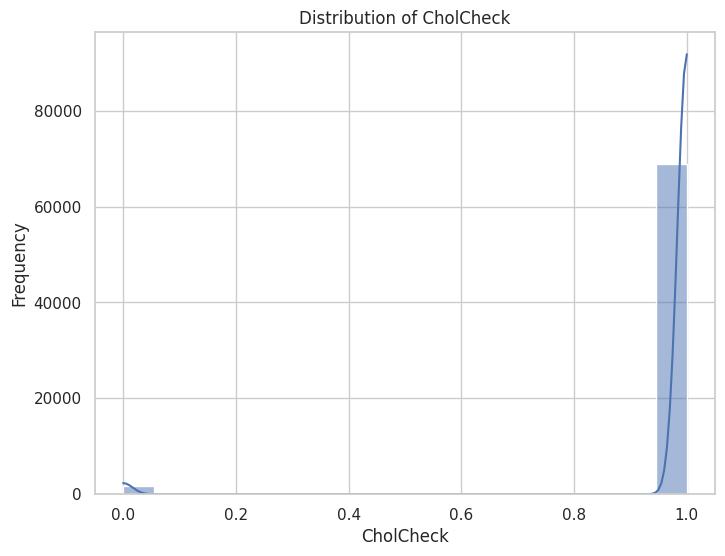

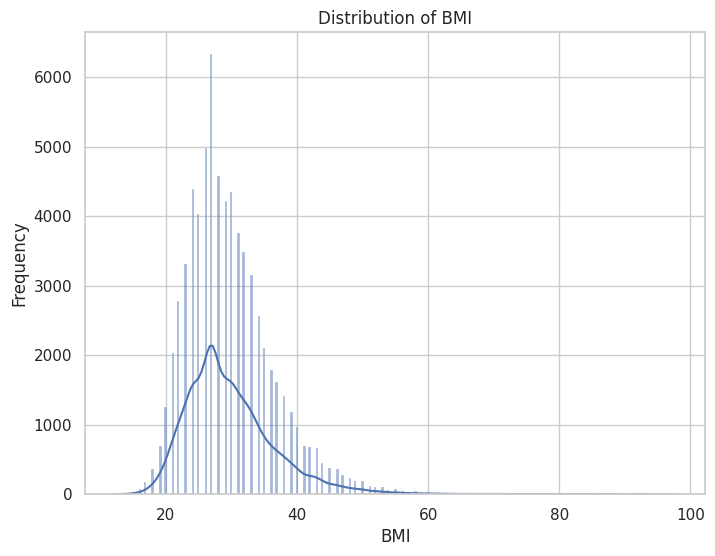

...

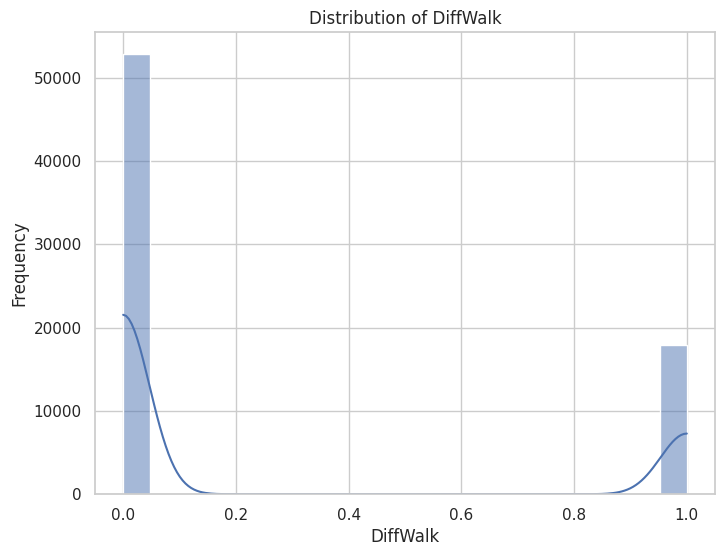

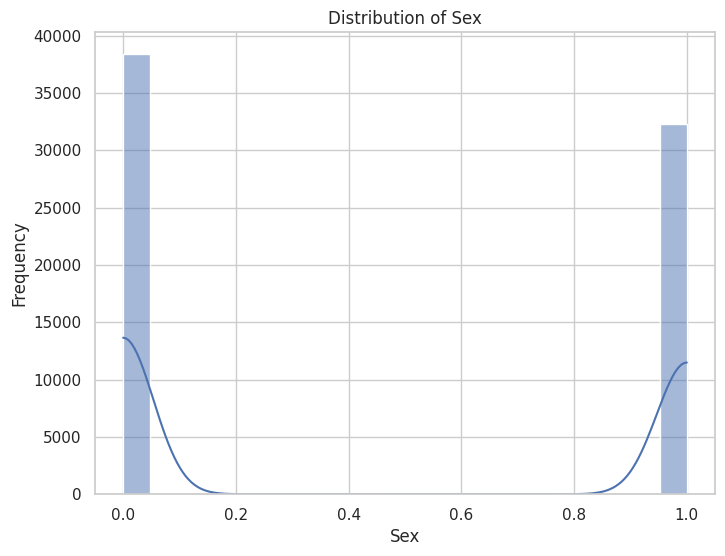

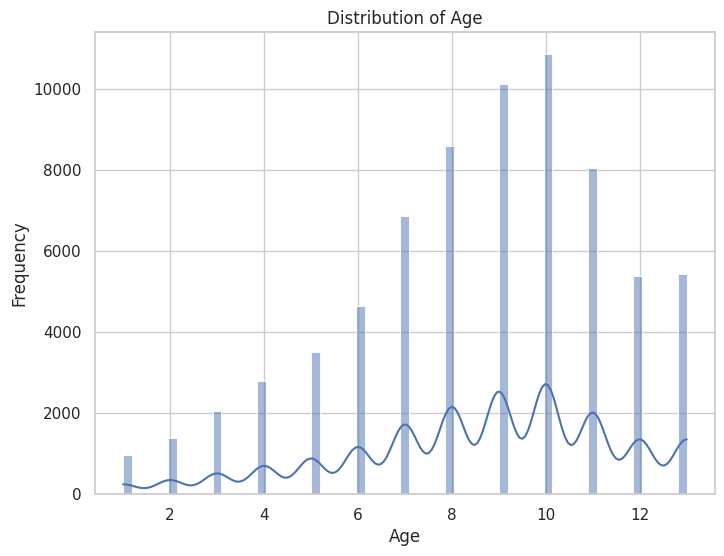

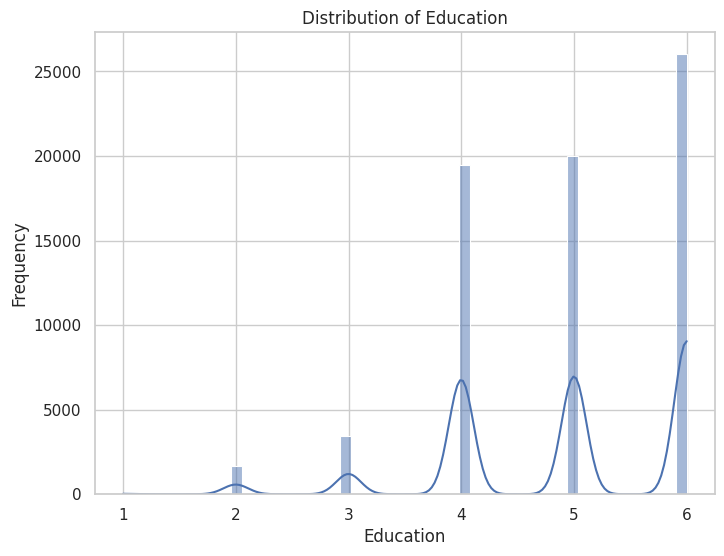

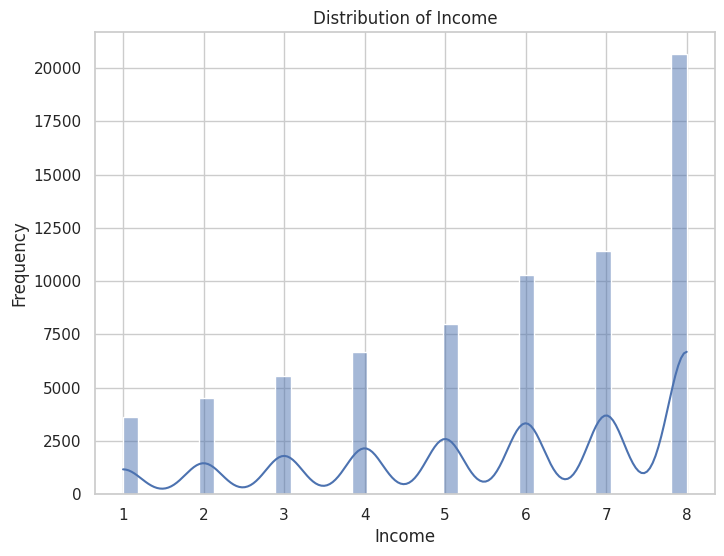

In [ ]:
# Visualize the distribution of each numerical column
sns.set(style="whitegrid")

# Plot histograms of numerical columns
numerical_cols = data3.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data3[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [ ]:
data3.isnull().sum()

Diabetes_binary         0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
HeartDiseaseorAttack    0
PhysActivity            0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

Correlation Matrix

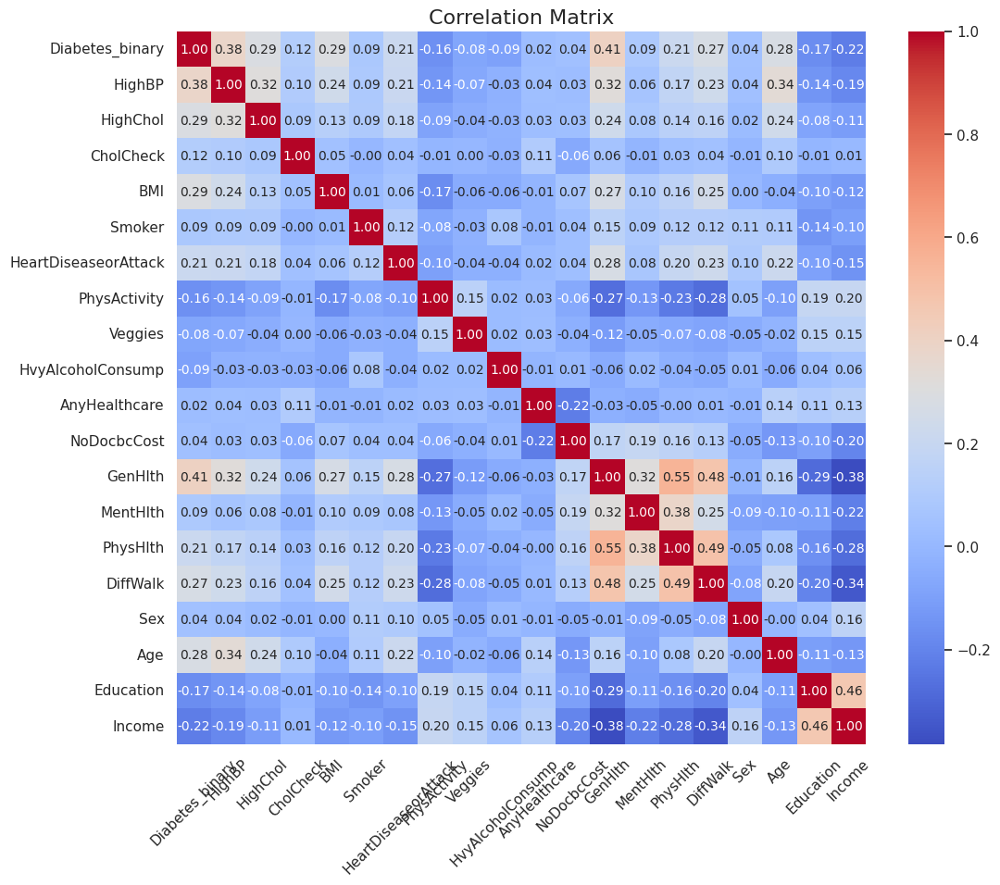

Diabetes_binary         1.000000
GenHlth                 0.407651
HighBP                  0.381537
BMI                     0.293390
HighChol                0.289197
Age                     0.278806
DiffWalk                0.272665
Income                  0.224419
PhysHlth                0.213047
HeartDiseaseorAttack    0.211546
Education               0.170457
PhysActivity            0.158668
CholCheck               0.115394
HvyAlcoholConsump       0.094866
MentHlth                0.087082
Smoker                  0.086041
Veggies                 0.079290
Sex                     0.044422
NoDocbcCost             0.041022
AnyHealthcare           0.023270
Name: Diabetes_binary, dtype: float64


In [ ]:
# Calculate correlation matrix
corr_matrix = data3.corr()

# Visualize correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10})
plt.title("Correlation Matrix", fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

# Identify columns with high correlation to the target column
target_corr = corr_matrix['Diabetes_binary'].abs().sort_values(ascending=False)
print(target_corr)

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5]),
 [Text(0, 0.5, 'Diabetes_binary'),
  Text(0, 1.5, 'HighBP'),
  Text(0, 2.5, 'HighChol'),
  Text(0, 3.5, 'CholCheck'),
  Text(0, 4.5, 'BMI'),
  Text(0, 5.5, 'Smoker'),
  Text(0, 6.5, 'HeartDiseaseorAttack'),
  Text(0, 7.5, 'PhysActivity'),
  Text(0, 8.5, 'Veggies'),
  Text(0, 9.5, 'HvyAlcoholConsump'),
  Text(0, 10.5, 'AnyHealthcare'),
  Text(0, 11.5, 'NoDocbcCost'),
  Text(0, 12.5, 'GenHlth'),
  Text(0, 13.5, 'MentHlth'),
  Text(0, 14.5, 'PhysHlth'),
  Text(0, 15.5, 'DiffWalk'),
  Text(0, 16.5, 'Sex'),
  Text(0, 17.5, 'Age'),
  Text(0, 18.5, 'Education'),
  Text(0, 19.5, 'Income')])

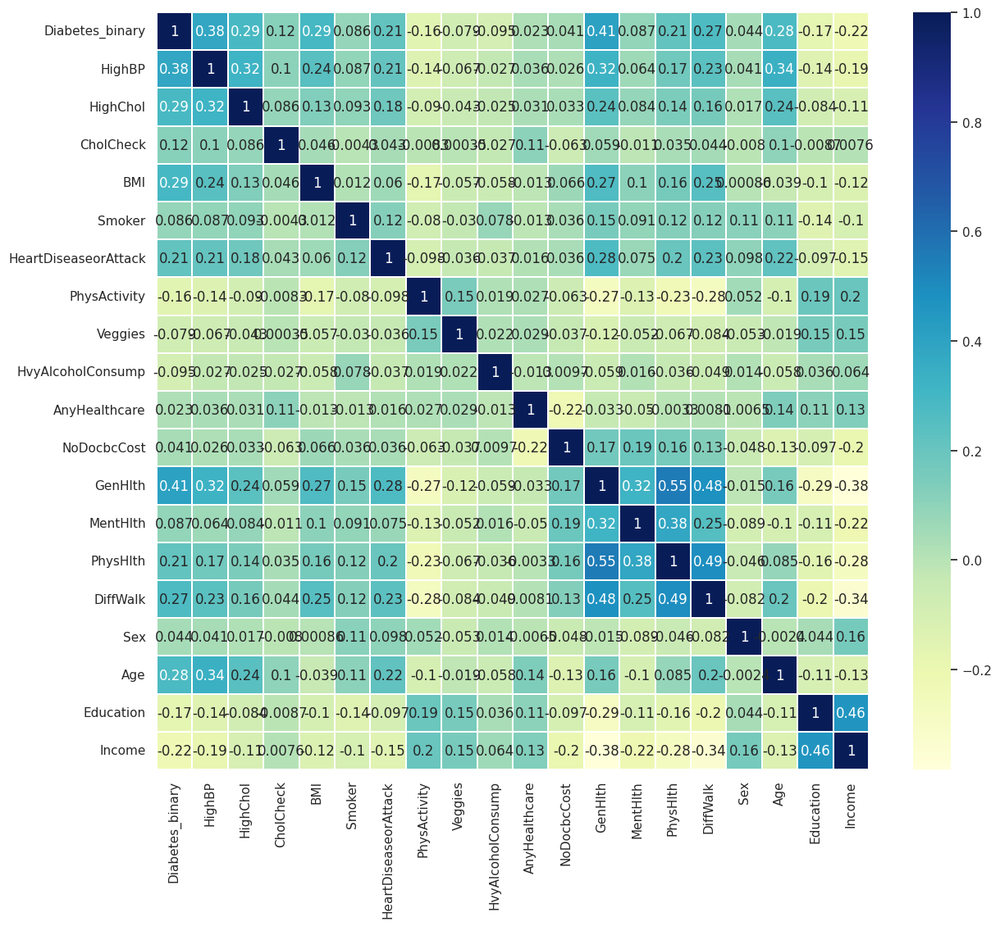

In [ ]:
plt.figure(figsize=(14,12))
sns.heatmap(data3.corr(), linewidths=.1, cmap="YlGnBu", annot=True)
plt.yticks(rotation=0)

## Outlier Detection and Removal

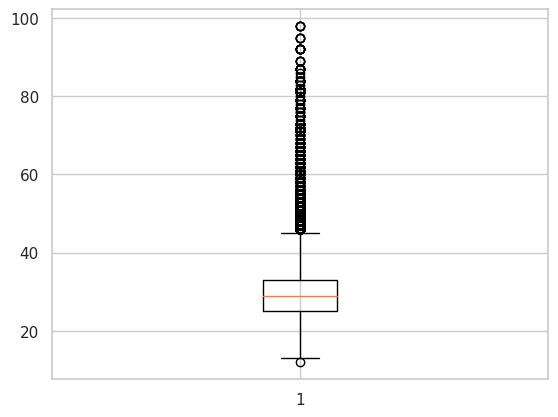

In [ ]:
plt.boxplot(data3['BMI'])
plt.show()

In [ ]:
mean = data3['BMI'].mean()
std  = data3['BMI'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data3 = data3[(data3['BMI'] >= lower_bound)
                & (data3['BMI'] <= upper_bound)]

Lower Bound : 15.628773302367975
Upper Bound : 44.08563772165511


# Merging Dataset 2 and 3

In [ ]:
data_2_3 = pd.merge(data2, data3, on=['HighBP' , 'HighChol' , 'CholCheck' , 'BMI', 'Smoker' , 'HeartDiseaseorAttack' , 'PhysActivity' , 'HvyAlcoholConsump' ,'AnyHealthcare' ,'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Education', 'Age','Diabetes_binary', 'Income'])

data_2_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123435 entries, 0 to 123434
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_binary       123435 non-null  float64
 1   HighBP                123435 non-null  int64  
 2   HighChol              123435 non-null  int64  
 3   CholCheck             123435 non-null  int64  
 4   BMI                   123435 non-null  int64  
 5   Smoker                123435 non-null  int64  
 6   Stroke                123435 non-null  int64  
 7   HeartDiseaseorAttack  123435 non-null  int64  
 8   PhysActivity          123435 non-null  int64  
 9   Fruits                123435 non-null  int64  
 10  HvyAlcoholConsump     123435 non-null  int64  
 11  AnyHealthcare         123435 non-null  int64  
 12  GenHlth               123435 non-null  int64  
 13  MentHlth              123435 non-null  int64  
 14  PhysHlth              123435 non-null  int64  
 15  

# Cleaning the Merged Dataset (Dataset 2 and Dataset 3)

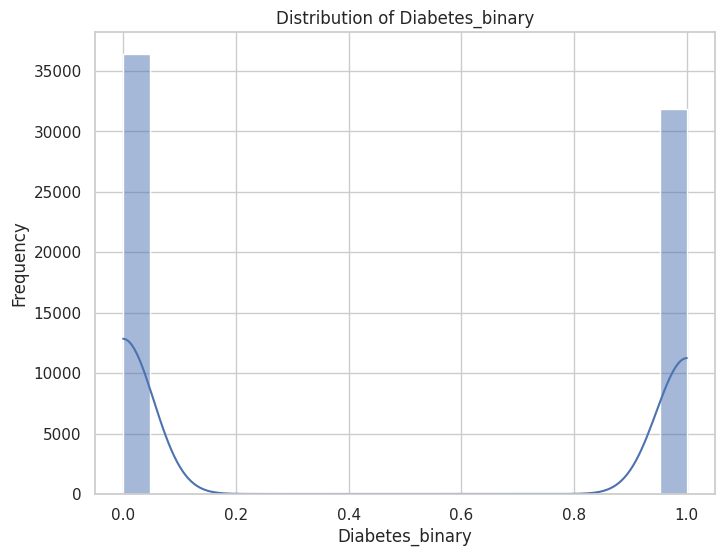

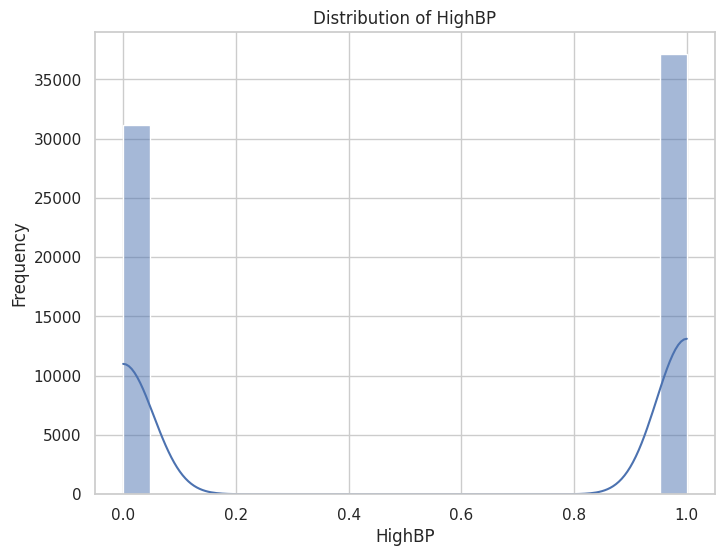

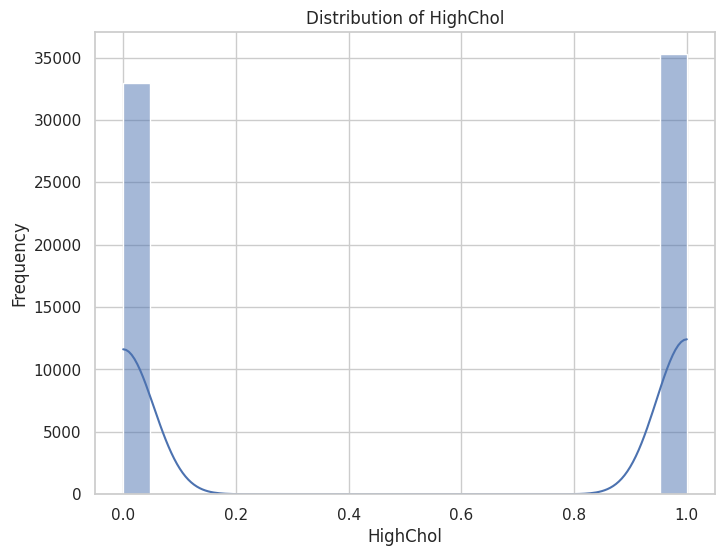

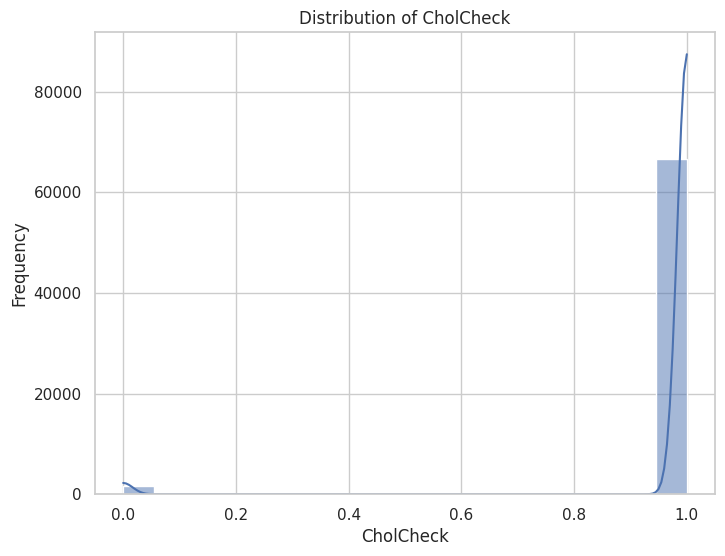

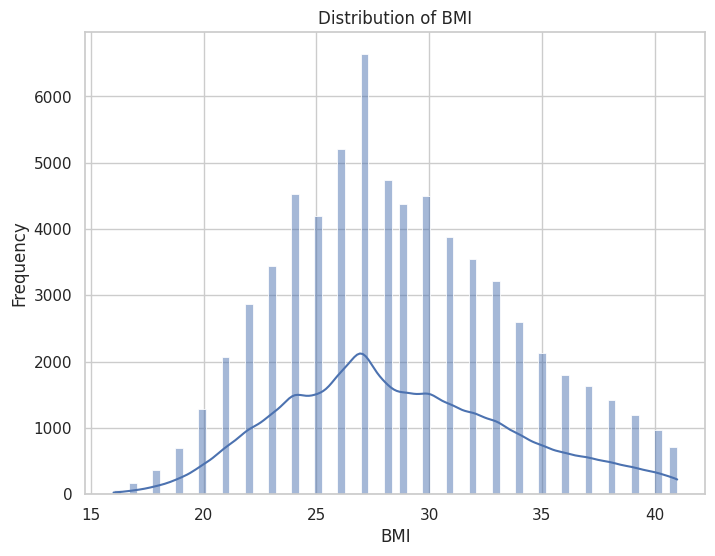

...

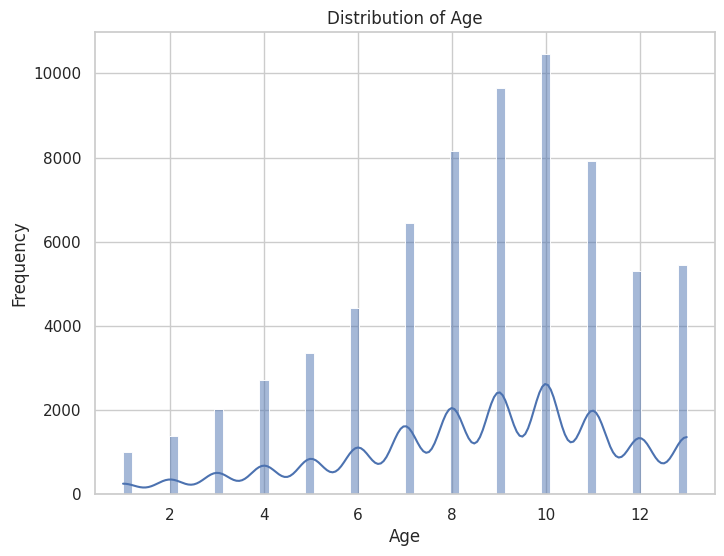

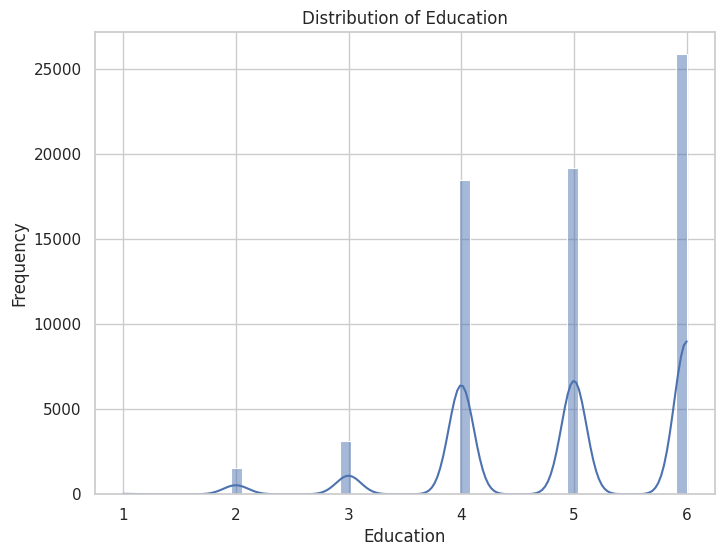

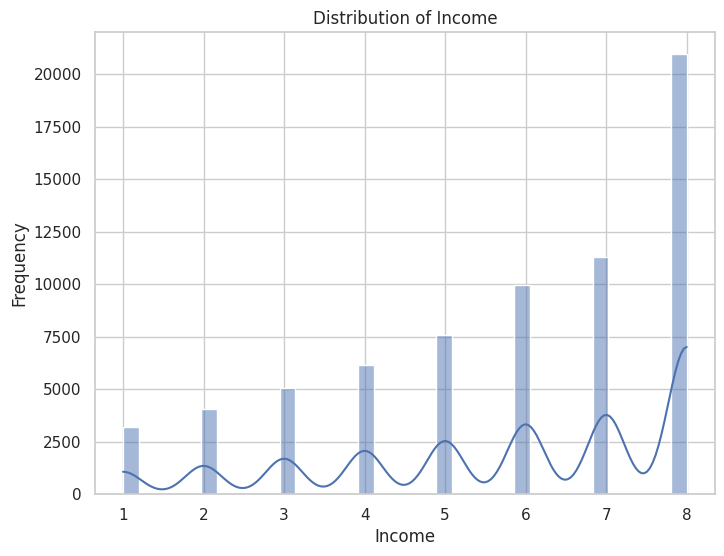

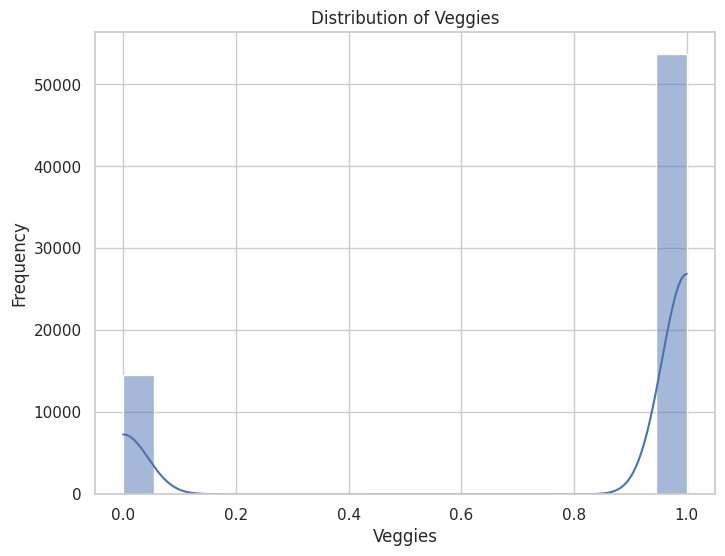

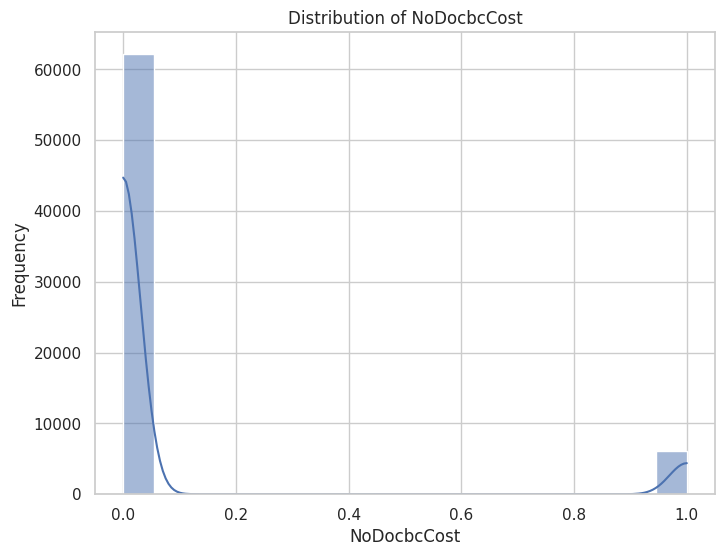

In [ ]:
# Plot histograms of numerical columns
numerical_cols = data_2_3.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data_2_3[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

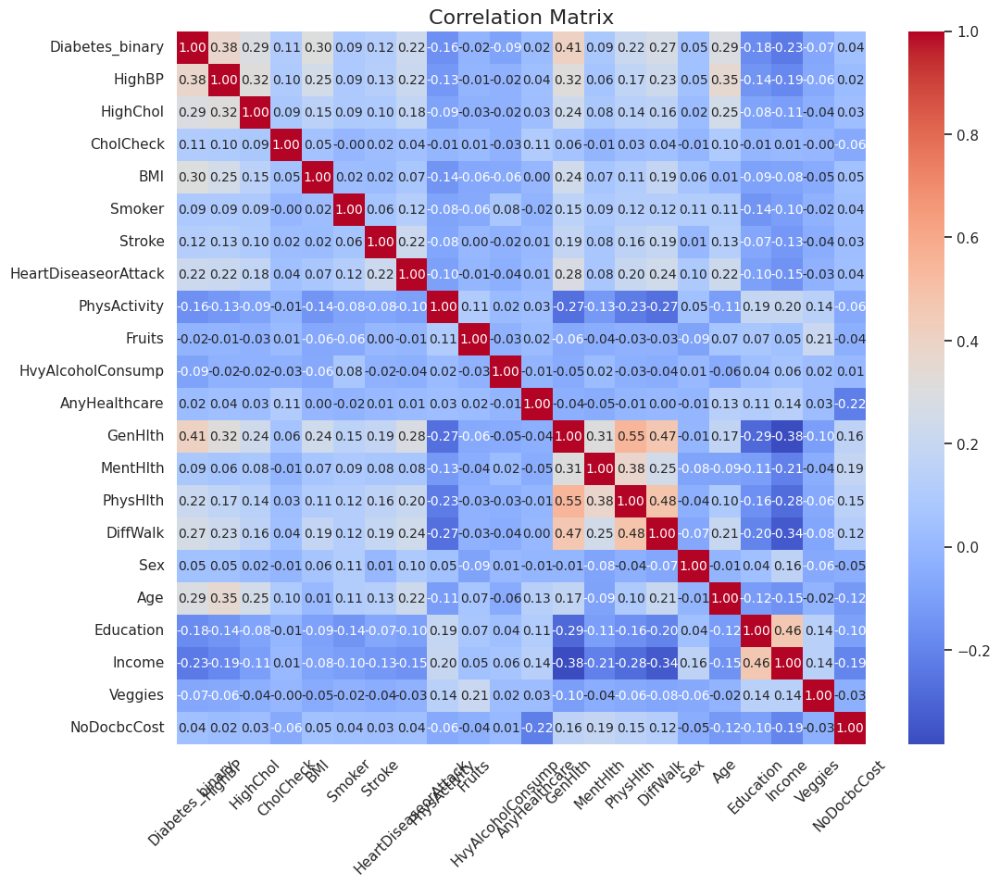

Diabetes_binary         1.000000
GenHlth                 0.410005
HighBP                  0.377452
BMI                     0.303857
Age                     0.291207
HighChol                0.287491
DiffWalk                0.268136
Income                  0.231887
HeartDiseaseorAttack    0.221907
PhysHlth                0.215384
Education               0.175865
PhysActivity            0.159483
Stroke                  0.124118
CholCheck               0.109247
Smoker                  0.089973
HvyAlcoholConsump       0.087979
MentHlth                0.087549
Veggies                 0.071314
Sex                     0.047105
NoDocbcCost             0.040593
Fruits                  0.019989
AnyHealthcare           0.019067
Name: Diabetes_binary, dtype: float64


In [ ]:
# Calculate correlation matrix
corr_matrix = data_2_3.corr()

# Visualize correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10})
plt.title("Correlation Matrix", fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

# Identify columns with high correlation to the target column
target_corr = corr_matrix['Diabetes_binary'].abs().sort_values(ascending=False)
print(target_corr)

# Modifying Dataset 1 and Previously Merged Dataset to Merge into Final Dataset

In [ ]:
# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: age
[80 54 28 36 76 20 44 79 42 32 53 78 67 15 37 40  5 69 72 30 45 43 50 41
 26 77 66 29 60 38  3 57 74 19 46 21 59 27 13 56  2  7 11 34  6 55  9 62
 47 12 68 75 22 58 18 24 17 25 16 33 31  8 49 39 65 14 70 48 51 71  4 64
 63 52 10 35 61 73 23  1]

Column: hypertension
[0 1]

Column: heart_disease
[1 0]

Column: bmi
[25.19 27.32 23.45 ... 38.12 34.81 39.96]

Column: HbA1c_level
[6.6 5.7 5.  4.8 6.5 6.1 5.8 3.5 6.  6.2 4.  4.5 7.  7.5 6.8]

Column: blood_glucose_level
[140  80 158 155  85 200 145 100 130 160 126 159  90]

Column: diabetes
[0. 1.]

Column: gender_Male
[0 1]

Column: smoking_history_current
[0 1]

Column: smoking_history_ever
[0 1]

Column: smoking_history_former
[0 1]

Column: smoking_history_never
[1 0]

Column: smoking_history_not current
[0 1]



In [ ]:
# Iterate through each column and display unique values
for column in data_2_3.columns:
    unique_values = data_2_3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Diabetes_binary
[0. 1.]

Column: HighBP
[1 0]

Column: HighChol
[1 0]

Column: CholCheck
[1 0]

Column: BMI
[40 25 30 26 28 23 38 27 32 37 34 31 24 33 29 21 35 22 16 41 36 20 39 18
 19 17]

Column: Smoker
[1 0]

Column: Stroke
[0 1]

Column: HeartDiseaseorAttack
[0 1]

Column: PhysActivity
[0 1]

Column: Fruits
[0 1]

Column: HvyAlcoholConsump
[0 1]

Column: AnyHealthcare
[1 0]

Column: GenHlth
[5 3 4 2 1]

Column: MentHlth
[18  0 30 15 20  2  4  5  1  3 14  7 10 29 25 21  6 12 24 17 13 28  8 27
 19 23  9 16 11 22 26]

Column: PhysHlth
[15  0 30 20  7  1  5 10  2  3 19 14  6 12 28 27 22 25 21  4  8 13 18 23
 29 17  9 16 11 26 24]

Column: DiffWalk
[1 0]

Column: Sex
[0 1]

Column: Age
[ 9.  7. 13. 11.  5. 10. 12.  8.  6.  4.  3.  2.  1.]

Column: Education
[4 6 5 2 3 1]

Column: Income
[3 1 8 7 6 4 5 2]

Column: Veggies
[1 0]

Column: NoDocbcCost
[0 1]



From the dataset actual source (Kaggle) we have got to know that Age values corresponding actual values. Source (https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset/data?select=diabetes_binary_health_indicators_BRFSS2015.csv)

<table>
<tr><td>Value</td><td>Age Between</td></tr>
<tr><td>1</td><td>18-24</td></tr>
<tr><td>2</td><td>25-29</td></tr>
<tr><td>3</td><td>30-34</td></tr>
<tr><td>4</td><td>35-39</td></tr>
<tr><td>5</td><td>40-44</td></tr>
<tr><td>6</td><td>45-49</td></tr>
<tr><td>7</td><td>50-54</td></tr>
<tr><td>8</td><td>55-59</td></tr>
<tr><td>9</td><td>60-64</td></tr>
<tr><td>10</td><td>65-69</td></tr>
<tr><td>11</td><td>70-74</td></tr>
<tr><td>12</td><td>75-79</td></tr>
<tr><td>13</td><td>80 or older</td></tr>
</table>

In [ ]:
# Define the age ranges
age_ranges = [0, 17, 24, 29, 34, 39, 44, 49, 54, 59, 64, 69, 74, 79, float('inf')]

# Create a new column with the age group indices based on the age ranges
data1['age'] = pd.cut(data1['age'], bins=age_ranges, right=True, labels=False)

# Print the updated DataFrame
print(data1['age'])

# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

0        13
1         7
2         2
3         4
4        12
         ..
99994     4
99996     0
99997    10
99998     1
99999     8
Name: age, Length: 86204, dtype: int64
Column: age
[13  7  2  4 12  1  5  3 10  0 11  6  9  8]

Column: hypertension
[0 1]

Column: heart_disease
[1 0]

Column: bmi
[25.19 27.32 23.45 ... 38.12 34.81 39.96]

Column: HbA1c_level
[6.6 5.7 5.  4.8 6.5 6.1 5.8 3.5 6.  6.2 4.  4.5 7.  7.5 6.8]

Column: blood_glucose_level
[140  80 158 155  85 200 145 100 130 160 126 159  90]

Column: diabetes
[0. 1.]

Column: gender_Male
[0 1]

Column: smoking_history_current
[0 1]

Column: smoking_history_ever
[0 1]

Column: smoking_history_former
[0 1]

Column: smoking_history_never
[1 0]

Column: smoking_history_not current
[0 1]



In [ ]:
# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: age
[13, 7, 2, 4, 12, ..., 0, 11, 6, 9, 8]
Length: 14
Categories (14, int64): [0 < 1 < 2 < 3 ... 10 < 11 < 12 < 13]

Column: hypertension
[0 1]

Column: heart_disease
[1 0]

Column: bmi
[25.19 27.32 23.45 ... 38.12 34.81 39.96]

Column: HbA1c_level
[6.6 5.7 5.  4.8 6.5 6.1 5.8 3.5 6.  6.2 4.  4.5 7.  7.5 6.8]

Column: blood_glucose_level
[140  80 158 155  85 200 145 100 130 160 126 159  90]

Column: diabetes
[0. 1.]

Column: gender_Male
[0 1]

Column: smoking_history_current
[0 1]

Column: smoking_history_ever
[0 1]

Column: smoking_history_former
[0 1]

Column: smoking_history_never
[1 0]

Column: smoking_history_not current
[0 1]



In [ ]:
# Create a new column 'smoker' based on the smoking history columns
data1['smoker'] = (data1['smoking_history_current'] | data1['smoking_history_ever'] |
                   data1['smoking_history_former'] | data1['smoking_history_not current'])

# Convert boolean values to 0 or 1
data1['smoker'] = data1['smoker'].astype(int)

# Drop the original smoking history columns if needed
data1.drop(['smoking_history_current', 'smoking_history_ever', 'smoking_history_former', 'smoking_history_never', 'smoking_history_not current'], axis=1, inplace=True)

# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: age
[13  7  2  4 12  1  5  3 10  0 11  6  9  8]

Column: hypertension
[0 1]

Column: heart_disease
[1 0]

Column: bmi
[25.19 27.32 23.45 ... 38.12 34.81 39.96]

Column: HbA1c_level
[6.6 5.7 5.  4.8 6.5 6.1 5.8 3.5 6.  6.2 4.  4.5 7.  7.5 6.8]

Column: blood_glucose_level
[140  80 158 155  85 200 145 100 130 160 126 159  90]

Column: diabetes
[0. 1.]

Column: gender_Male
[0 1]

Column: smoker
[0 1]



In [ ]:
# Convert all column names to uppercase
data1.columns = data1.columns.str.upper()

In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86204 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   AGE                  86204 non-null  int64  
 1   HYPERTENSION         86204 non-null  int64  
 2   HEART_DISEASE        86204 non-null  int64  
 3   BMI                  86204 non-null  float64
 4   HBA1C_LEVEL          86204 non-null  float64
 5   BLOOD_GLUCOSE_LEVEL  86204 non-null  int64  
 6   DIABETES             86204 non-null  float64
 7   GENDER_MALE          86204 non-null  int64  
 8   SMOKER               86204 non-null  int64  
dtypes: float64(3), int64(6)
memory usage: 6.6 MB


In [ ]:
# Convert all column names to uppercase
data_2_3.columns = data_2_3.columns.str.upper()

In [ ]:
data_2_3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 68257 entries, 0 to 123434
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   DIABETES_BINARY       68257 non-null  float64
 1   HIGHBP                68257 non-null  int64  
 2   HIGHCHOL              68257 non-null  int64  
 3   CHOLCHECK             68257 non-null  int64  
 4   BMI                   68257 non-null  int64  
 5   SMOKER                68257 non-null  int64  
 6   STROKE                68257 non-null  int64  
 7   HEARTDISEASEORATTACK  68257 non-null  int64  
 8   PHYSACTIVITY          68257 non-null  int64  
 9   FRUITS                68257 non-null  int64  
 10  HVYALCOHOLCONSUMP     68257 non-null  int64  
 11  ANYHEALTHCARE         68257 non-null  int64  
 12  GENHLTH               68257 non-null  int64  
 13  MENTHLTH              68257 non-null  int64  
 14  PHYSHLTH              68257 non-null  int64  
 15  DIFFWALK              6

In [ ]:
# Rename 'DIABETES_BINARY' to 'DIABETES' and 'SEX' to 'GENDER_MALE' and 'HEARTDISEASEORATTACK' to 'HEART_DISEASE'
data_2_3 = data_2_3.rename(columns={'DIABETES_BINARY': 'DIABETES', 'SEX': 'GENDER_MALE', 'HEARTDISEASEORATTACK':'HEART_DISEASE'})

In [ ]:
data_2_3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 68257 entries, 0 to 123434
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   DIABETES           68257 non-null  float64
 1   HIGHBP             68257 non-null  int64  
 2   HIGHCHOL           68257 non-null  int64  
 3   CHOLCHECK          68257 non-null  int64  
 4   BMI                68257 non-null  int64  
 5   SMOKER             68257 non-null  int64  
 6   STROKE             68257 non-null  int64  
 7   HEART_DISEASE      68257 non-null  int64  
 8   PHYSACTIVITY       68257 non-null  int64  
 9   FRUITS             68257 non-null  int64  
 10  HVYALCOHOLCONSUMP  68257 non-null  int64  
 11  ANYHEALTHCARE      68257 non-null  int64  
 12  GENHLTH            68257 non-null  int64  
 13  MENTHLTH           68257 non-null  int64  
 14  PHYSHLTH           68257 non-null  int64  
 15  DIFFWALK           68257 non-null  int64  
 16  GENDER_MALE        68257 n

# Merging into Final dataset

In [ ]:
# Combine the two DataFrames based on all common columns
data_1_2_3 = pd.merge(data1, data_2_3, how='inner', on=['DIABETES', 'SMOKER', 'HEART_DISEASE', 'GENDER_MALE', 'BMI', 'AGE'])

# Display the combined DataFrame
print(data_1_2_3)

       AGE  HYPERTENSION  HEART_DISEASE   BMI  HBA1C_LEVEL  \
0        3             0              0  24.0          5.0   
1        3             0              0  24.0          5.0   
2        3             0              0  24.0          5.0   
3        3             0              0  24.0          5.0   
4        3             0              0  24.0          5.0   
...    ...           ...            ...   ...          ...   
48263   11             0              0  32.0          5.8   
48264   11             0              0  32.0          5.8   
48265   11             0              0  32.0          5.8   
48266   11             0              0  32.0          5.8   
48267   11             0              0  32.0          5.8   

       BLOOD_GLUCOSE_LEVEL  DIABETES  GENDER_MALE  SMOKER  HIGHBP  ...  \
0                       85       0.0            1       0       0  ...   
1                       85       0.0            1       0       0  ...   
2                       85       

In [ ]:
# Iterate through each column and display unique values
for column in data_1_2_3.columns:
    unique_values = data_1_2_3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: AGE
[ 3  6  4  7 10  1  5  8  9 13 12  2 11]

Column: HYPERTENSION
[0 1]

Column: HEART_DISEASE
[0 1]

Column: BMI
[24. 40. 27. 23. 34. 38. 32. 30. 31. 29. 26. 25. 28. 22. 36. 18. 35. 33.
 20. 21. 37. 19. 16. 39. 17.]

Column: HBA1C_LEVEL
[5.  6.1 4.8 4.5 3.5 4.  6.6 5.8 6.2 6.  7.5 6.5 5.7 7.  6.8]

Column: BLOOD_GLUCOSE_LEVEL
[ 85 145  90 126 140 160 158 100 159 200  80 155 130]

Column: DIABETES
[0. 1.]

Column: GENDER_MALE
[1 0]

Column: SMOKER
[0 1]

Column: HIGHBP
[0 1]

Column: HIGHCHOL
[0 1]

Column: CHOLCHECK
[1 0]

Column: STROKE
[0 1]

Column: PHYSACTIVITY
[1 0]

Column: FRUITS
[1 0]

Column: HVYALCOHOLCONSUMP
[0 1]

Column: ANYHEALTHCARE
[1 0]

Column: GENHLTH
[2 3 1 4 5]

Column: MENTHLTH
[ 0  2 15  3 30  7  4  1 10  5 20 14 28 21  6 25 12 23  8 26 17  9 22 29
 16 11 13 27 18 19 24]

Column: PHYSHLTH
[ 0  2  4  1 10  5  7  3 21 30 15 14 20 25 28  6  8 18 12  9 27 23 19 26
 29 11 17 13 16 24 22]

Column: DIFFWALK
[0 1]

Column: EDUCATION
[5 6 4 3 2 1]

Column: INCOM

In [ ]:
# Iterate through each column and display value counts
for column in data1.columns:
    print(f"Column: {column}")
    print(data1[column].value_counts())
    print()

Column: AGE
AGE
0     12712
1      6570
7      5665
6      5623
8      5315
5      5116
4      4886
2      4844
9      4767
3      4703
13     4077
10     3906
11     3184
12     2744
Name: count, dtype: int64

Column: HYPERTENSION
HYPERTENSION
0    68366
1     5746
Name: count, dtype: int64

Column: HEART_DISEASE
HEART_DISEASE
0    71061
1     3051
Name: count, dtype: int64

Column: BMI
BMI
27.32    8993
23.00     101
27.12      99
22.40      99
25.00      96
         ... 
39.16       1
37.92       1
39.26       1
39.95       1
38.34       1
Name: count, Length: 2582, dtype: int64

Column: HBA1C_LEVEL
HBA1C_LEVEL
5.7    6387
6.5    6323
6.6    6321
6.2    6276
5.8    6262
6.0    6261
6.1    5997
4.5    5927
4.8    5871
3.5    5859
4.0    5859
5.0    5787
7.5     349
6.8     330
7.0     303
Name: count, dtype: int64

Column: BLOOD_GLUCOSE_LEVEL
BLOOD_GLUCOSE_LEVEL
126    5957
159    5945
130    5877
145    5856
140    5843
160    5819
155    5773
200    5753
90     5557
100    5521
80 

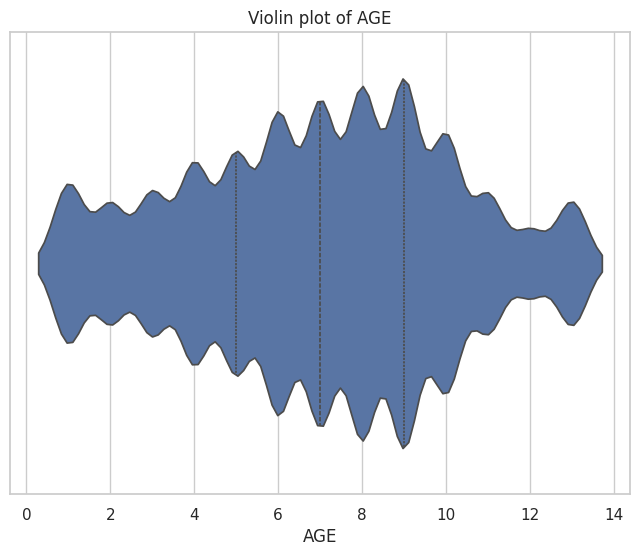

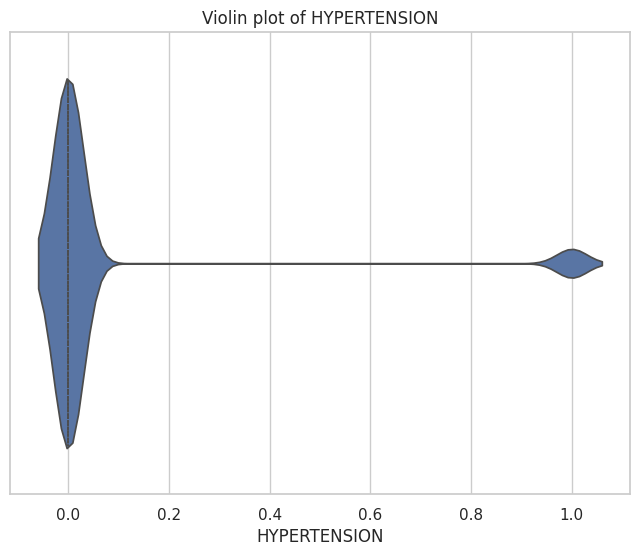

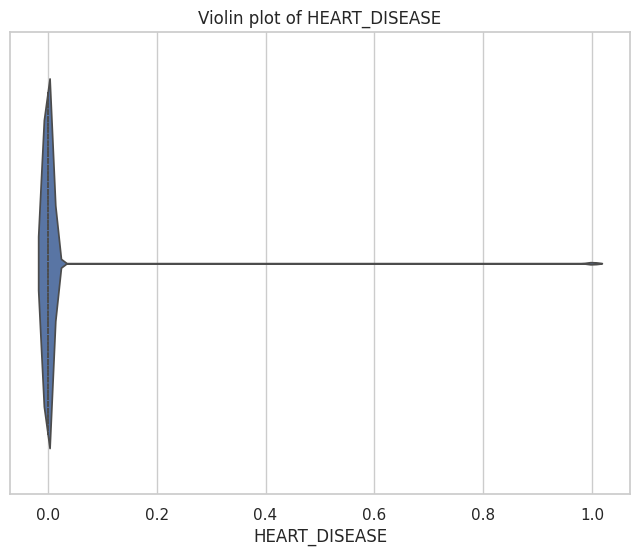

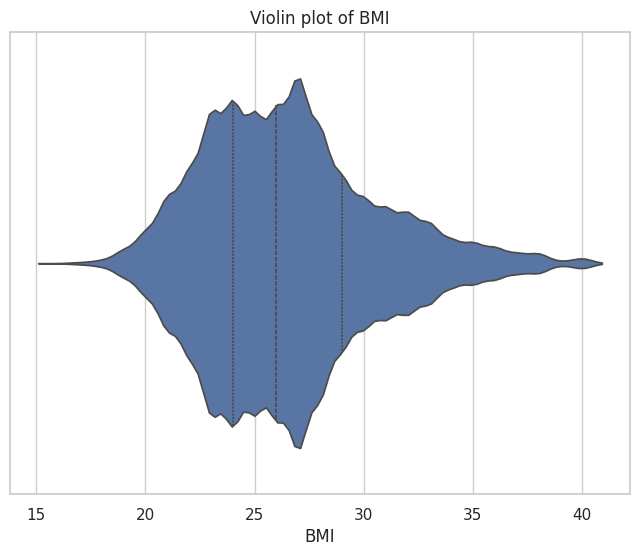

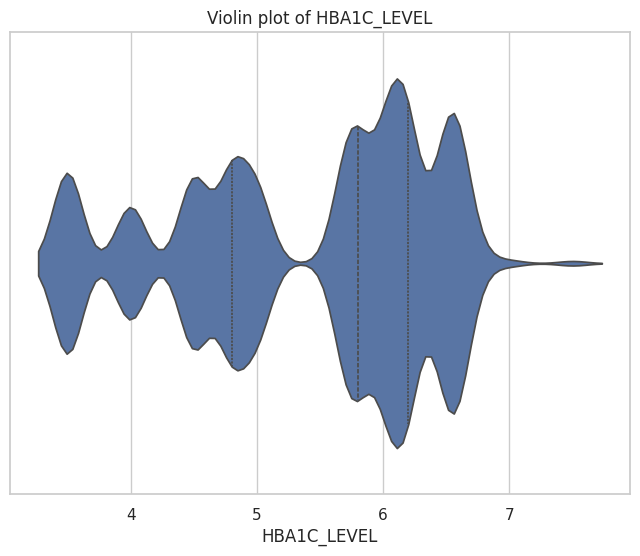

...

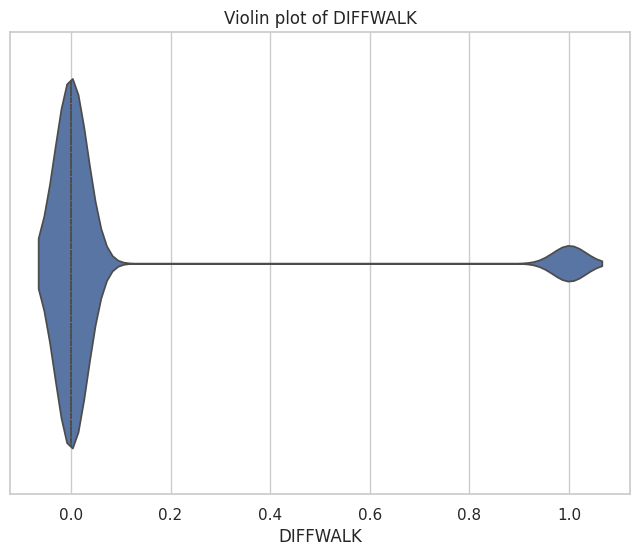

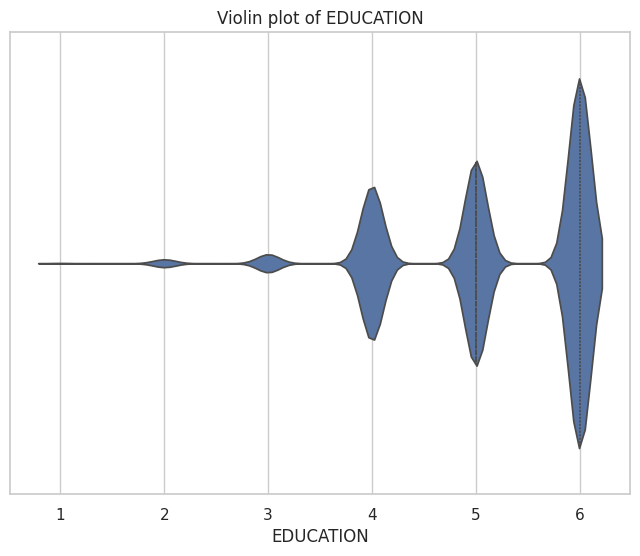

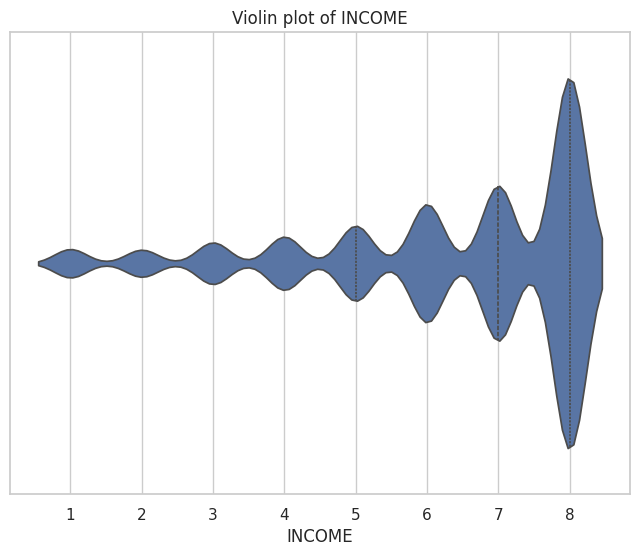

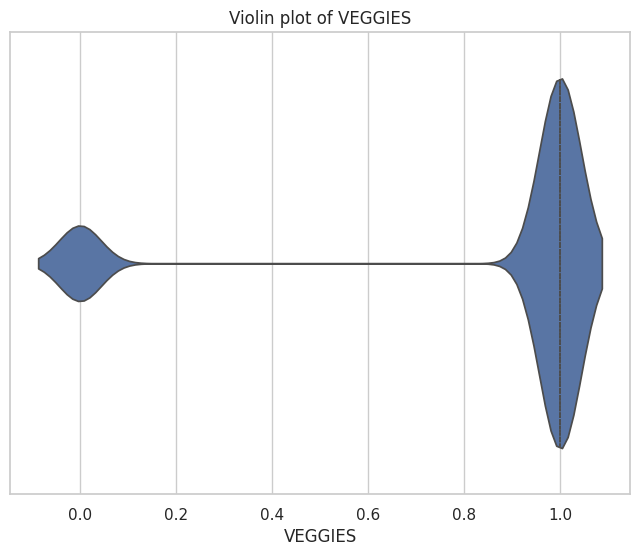

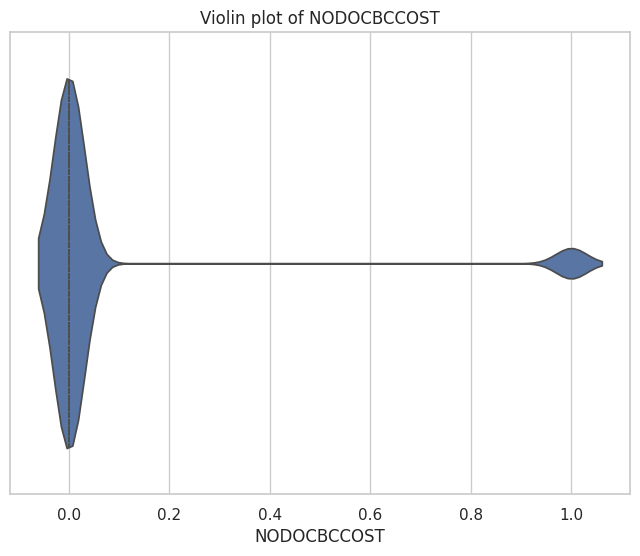

In [ ]:
sns.set(style="whitegrid")

# Plot violin plots of numerical columns
numerical_cols = data_1_2_3.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.violinplot(x=data_1_2_3[col], inner="quartile")
    plt.title(f'Violin plot of {col}')
    plt.xlabel(col)
    plt.show()

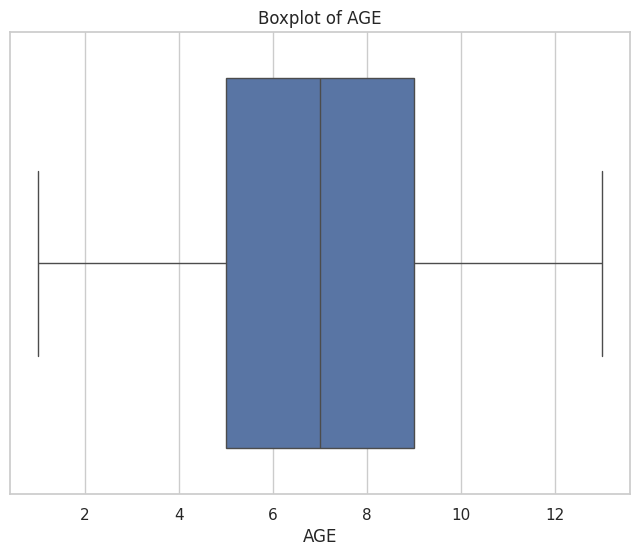

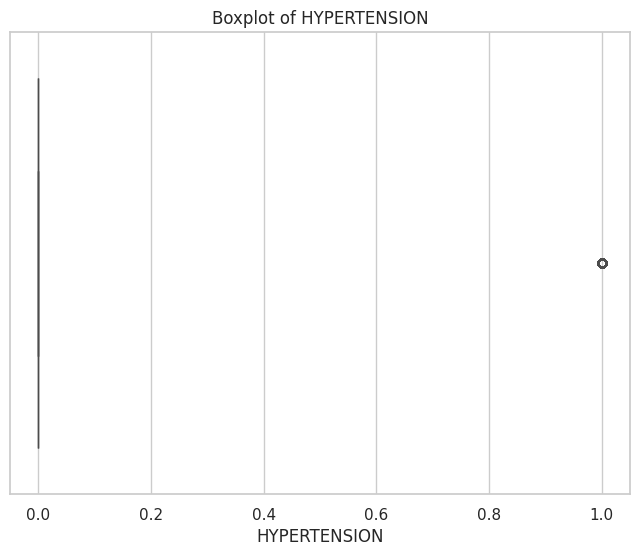

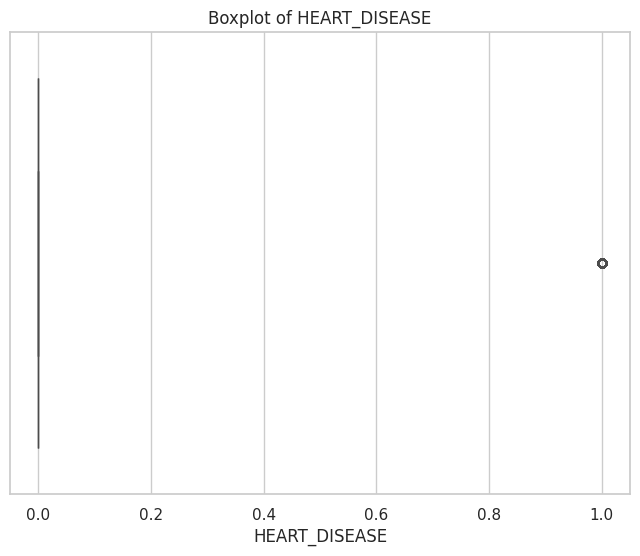

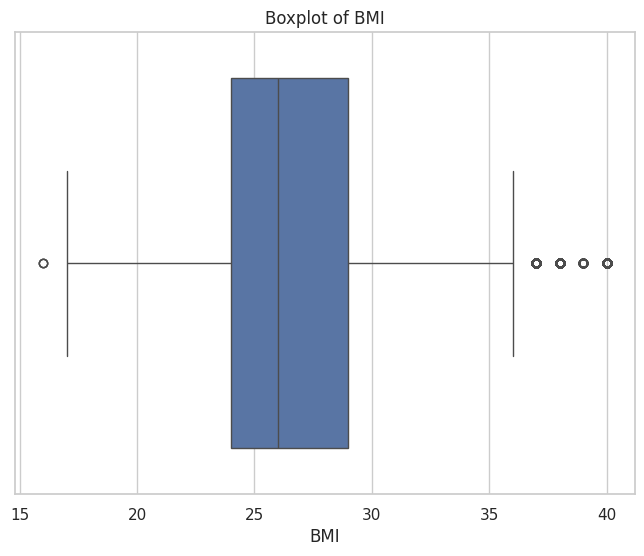

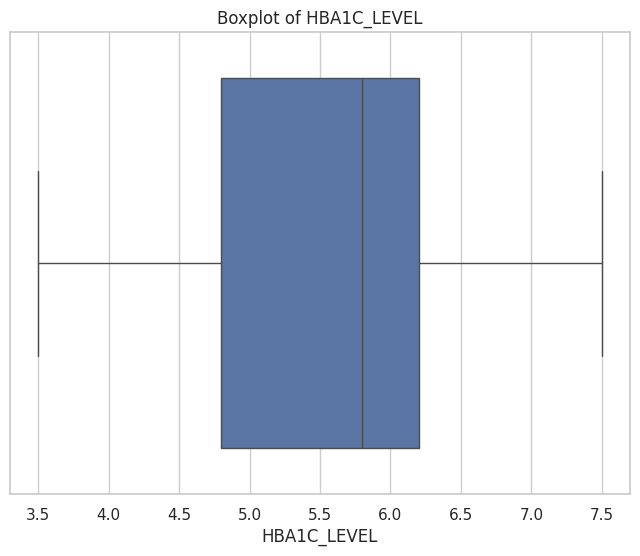

...

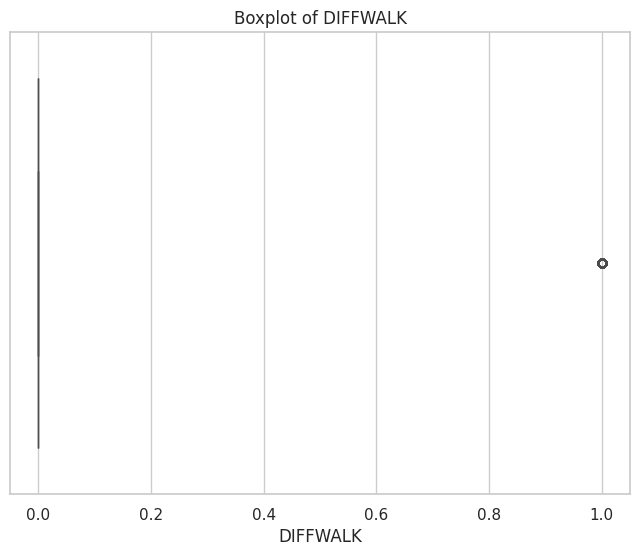

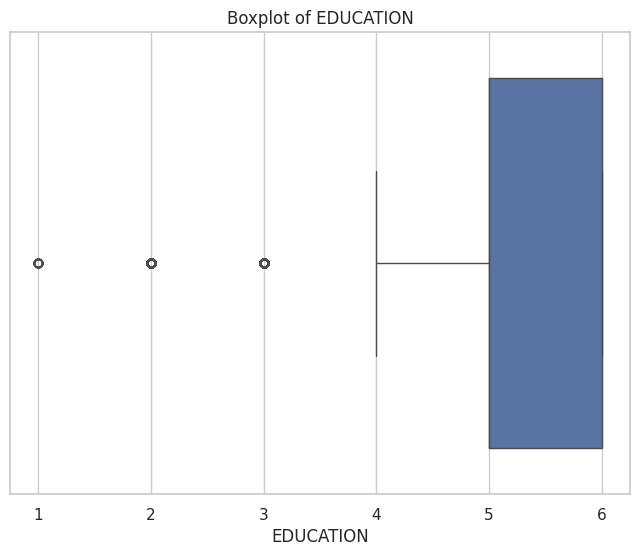

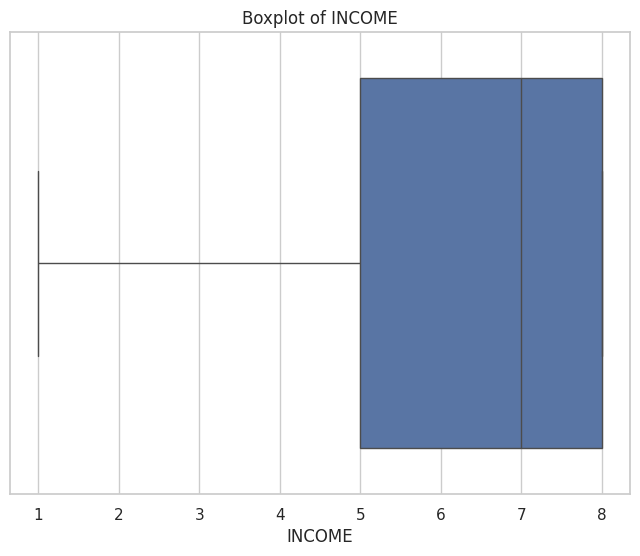

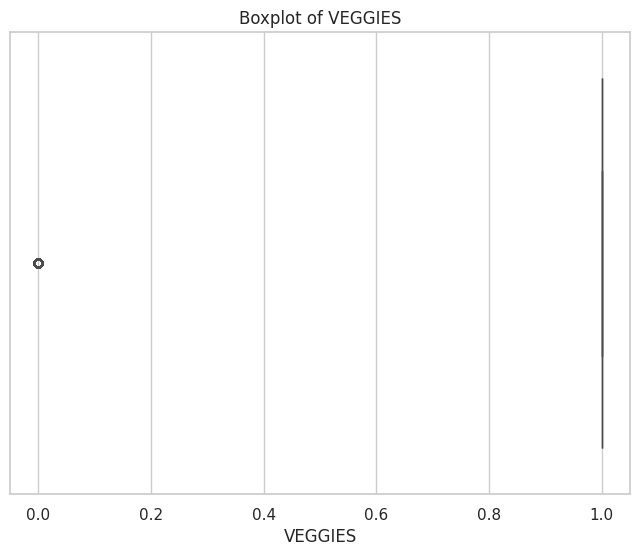

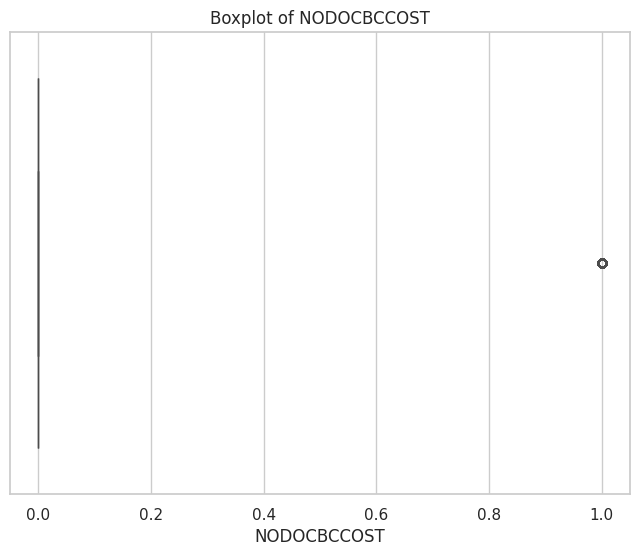

In [ ]:
sns.set(style="whitegrid")

# Plot boxplots of numerical columns
numerical_cols = data_1_2_3.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=data_1_2_3[col])
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.show()

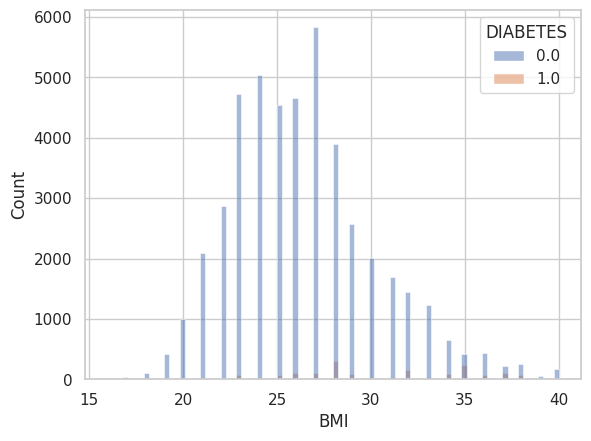

In [ ]:
sns.histplot(data=data_1_2_3,x='BMI',hue='DIABETES')
plt.show()

## Outlier Detection and Removal

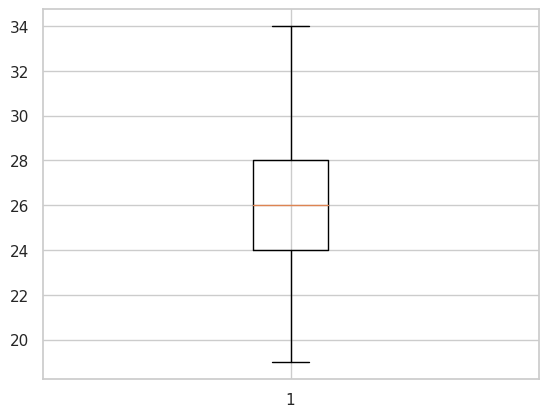

In [ ]:
plt.boxplot(data_1_2_3['BMI'])
plt.show()

In [ ]:
mean = data_1_2_3['BMI'].mean()
std  = data_1_2_3['BMI'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data_1_2_3 = data_1_2_3[(data_1_2_3['BMI'] >= lower_bound)
                & (data_1_2_3['BMI'] <= upper_bound)]

Lower Bound : 18.62634715387032
Upper Bound : 34.375698348112564


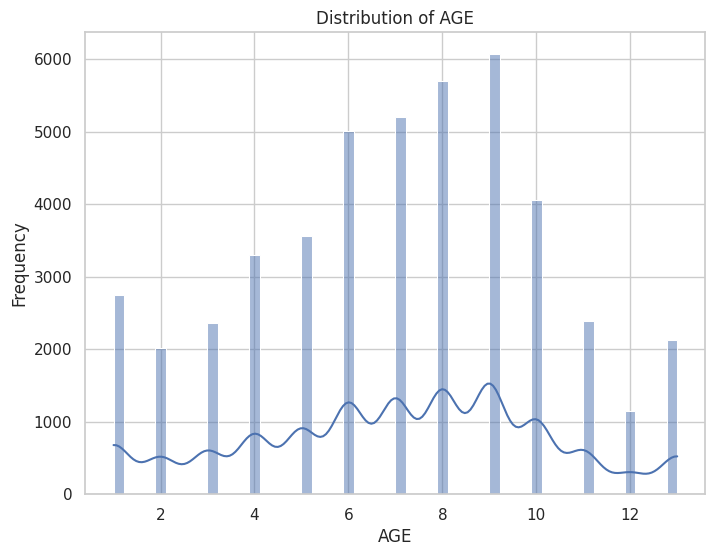

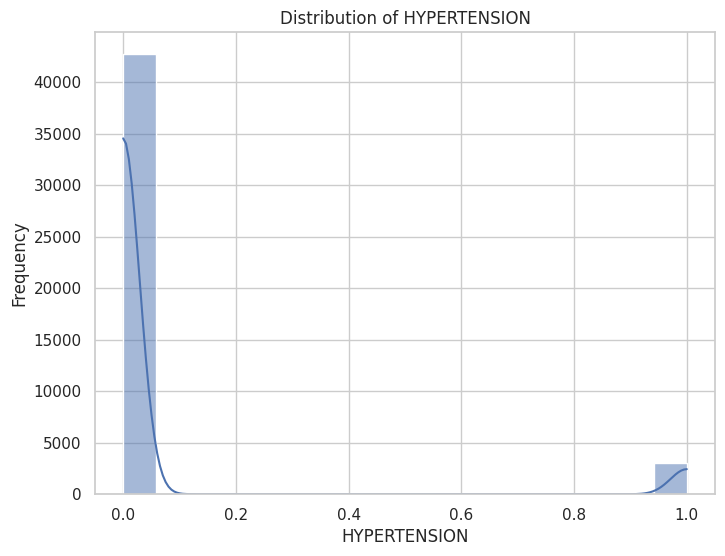

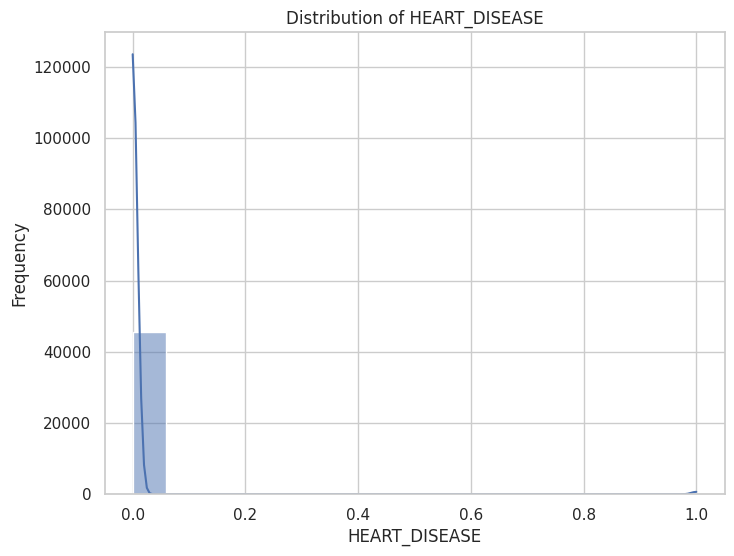

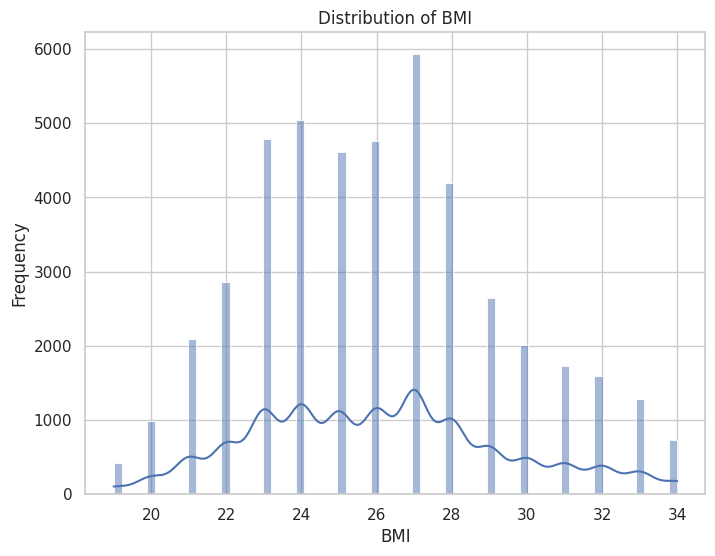

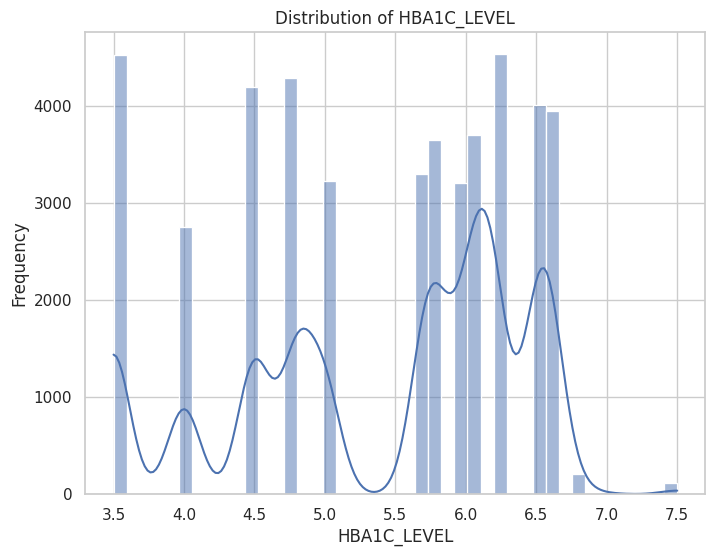

...

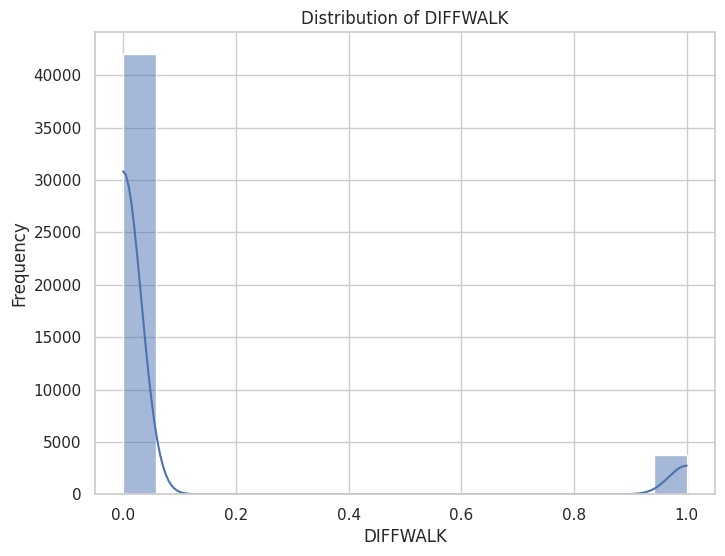

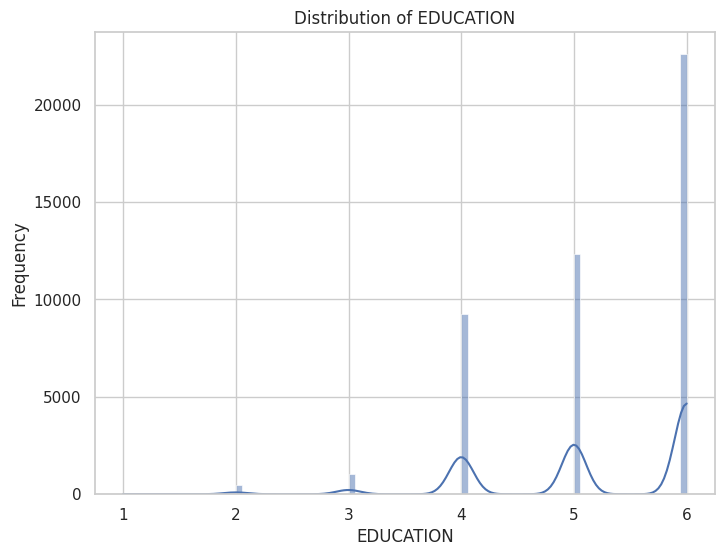

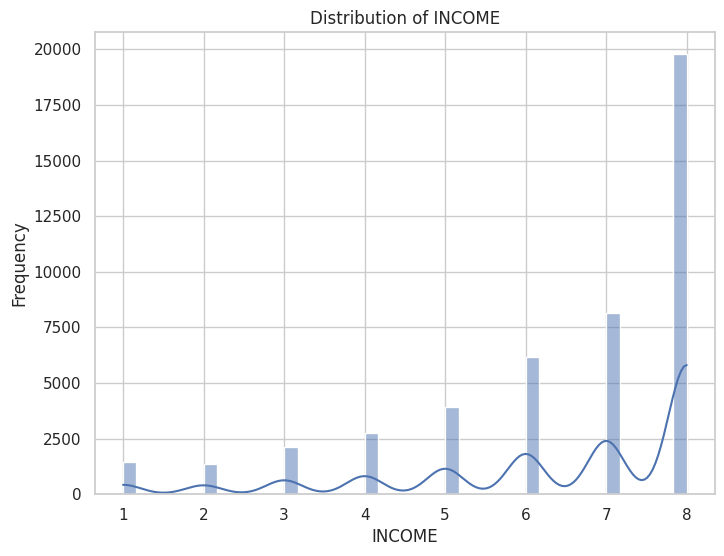

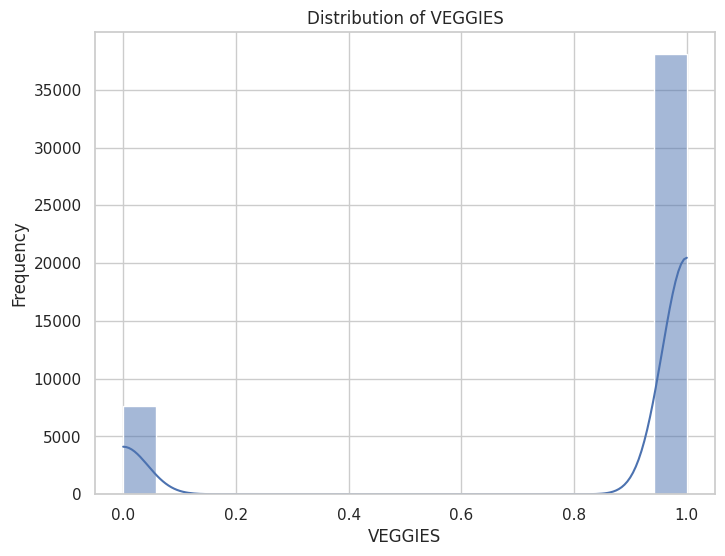

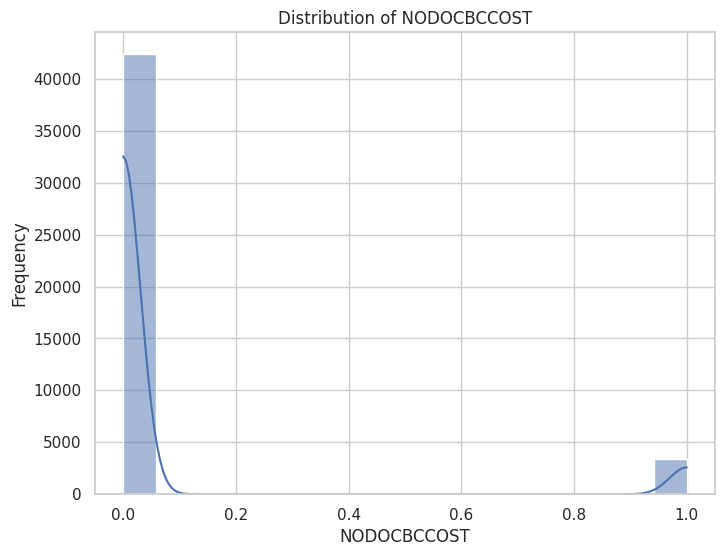

In [ ]:
# Visualize the distribution of each numerical column
sns.set(style="whitegrid")

# Plot histograms of numerical columns
numerical_cols = data_1_2_3.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data_1_2_3[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

## Checking Nulls and Duplicates and Dealing with them

In [ ]:
data_1_2_3.isnull().sum()

AGE                    0
HYPERTENSION           0
HEART_DISEASE          0
BMI                    0
HBA1C_LEVEL            0
BLOOD_GLUCOSE_LEVEL    0
DIABETES               0
GENDER_MALE            0
SMOKER                 0
HIGHBP                 0
HIGHCHOL               0
CHOLCHECK              0
STROKE                 0
PHYSACTIVITY           0
FRUITS                 0
HVYALCOHOLCONSUMP      0
ANYHEALTHCARE          0
GENHLTH                0
MENTHLTH               0
PHYSHLTH               0
DIFFWALK               0
EDUCATION              0
INCOME                 0
VEGGIES                0
NODOCBCCOST            0
dtype: int64

In [ ]:
data_1_2_3.duplicated().sum()

0

In [ ]:
data_1_2_3 = data_1_2_3.drop_duplicates()
print(f"No. of Duplcate rows after deleting duplicate rows: {data_1_2_3.duplicated().sum()}")

No. of Duplcate rows after deleting duplicate rows: 0


# Exploratory Data Analysis

In [ ]:
# Display summary statistics for numerical columns
summary_stats = data_1_2_3.describe()
print(summary_stats)

                AGE  HYPERTENSION  HEART_DISEASE           BMI   HBA1C_LEVEL  \
count  45732.000000  45732.000000   45732.000000  45732.000000  45732.000000   
mean       7.000984      0.065906       0.005488     26.076336      5.404935   
std        3.124290      0.248120       0.073882      3.345723      0.997413   
min        1.000000      0.000000       0.000000     19.000000      3.500000   
25%        5.000000      0.000000       0.000000     24.000000      4.500000   
50%        7.000000      0.000000       0.000000     26.000000      5.800000   
75%        9.000000      0.000000       0.000000     28.000000      6.200000   
max       13.000000      1.000000       1.000000     34.000000      7.500000   

       BLOOD_GLUCOSE_LEVEL      DIABETES   GENDER_MALE        SMOKER  \
count         45732.000000  45732.000000  45732.000000  45732.000000   
mean            131.311948      0.023813      0.264016      0.213942   
std              34.214994      0.152467      0.440813      0.4

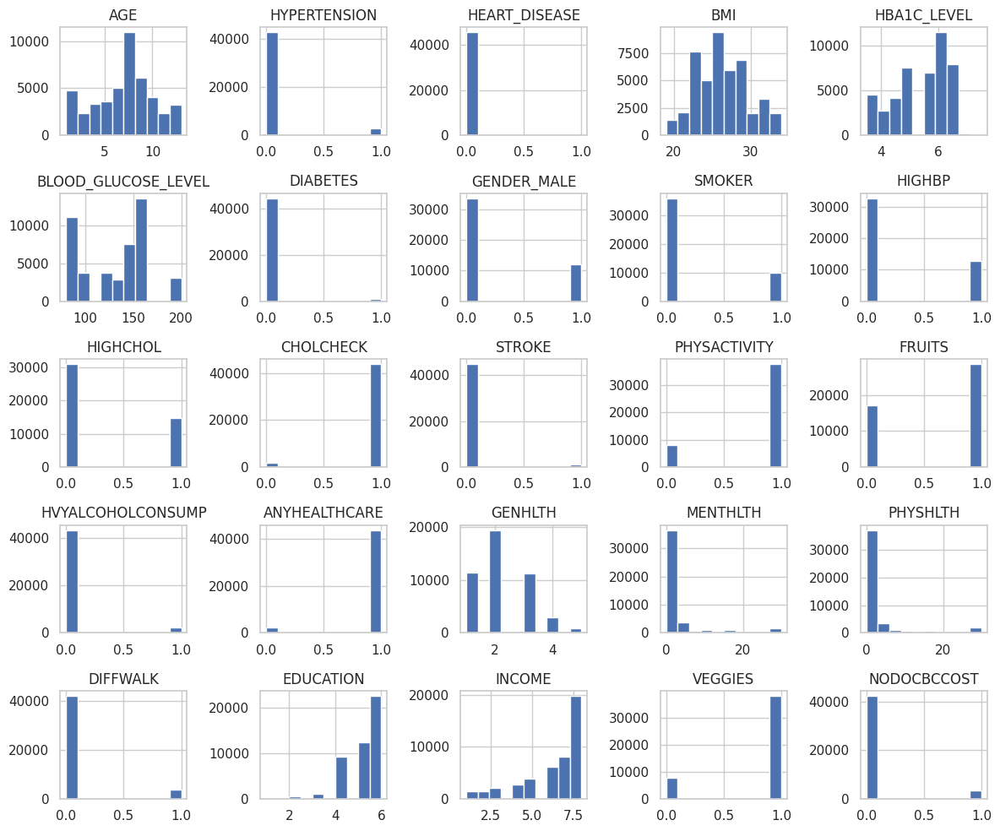

In [ ]:
# Plot histograms of numerical columns
data_1_2_3.hist(figsize=(12, 10))
plt.tight_layout()
plt.show()

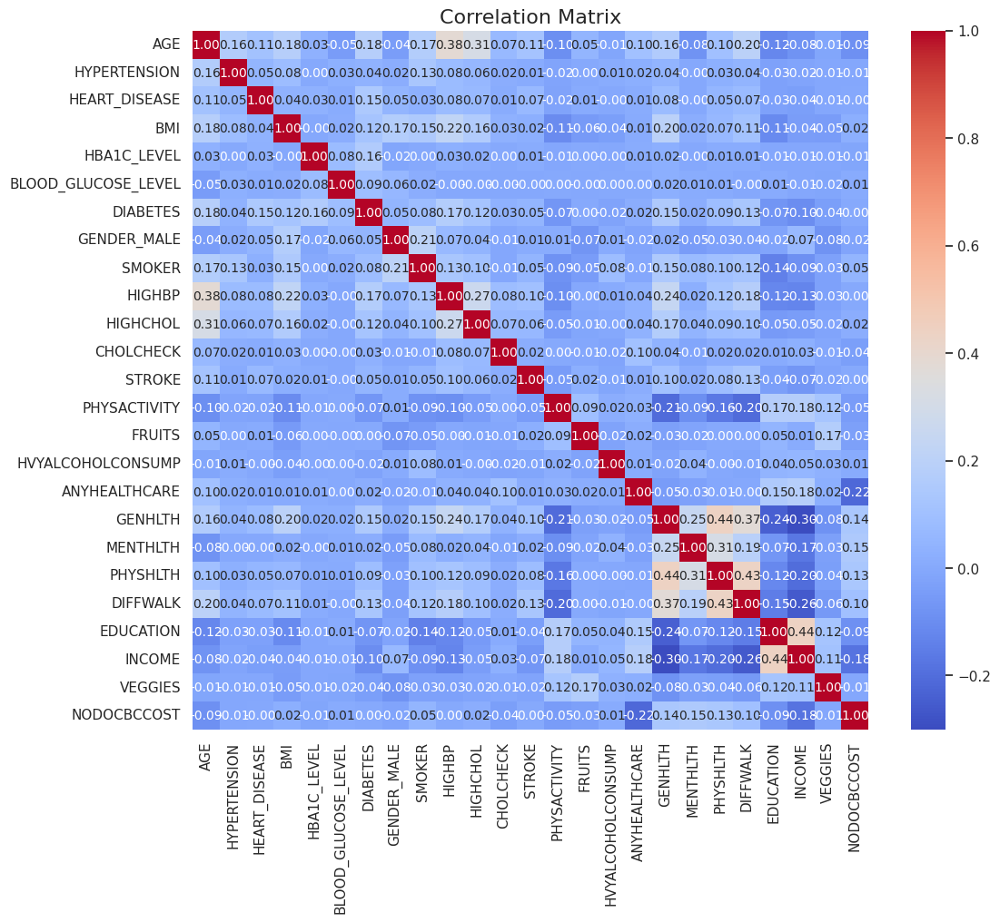

In [ ]:
corr_matrix = data_1_2_3.corr()

# Plot correlation matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title("Correlation Matrix", fontsize=16)
plt.show()

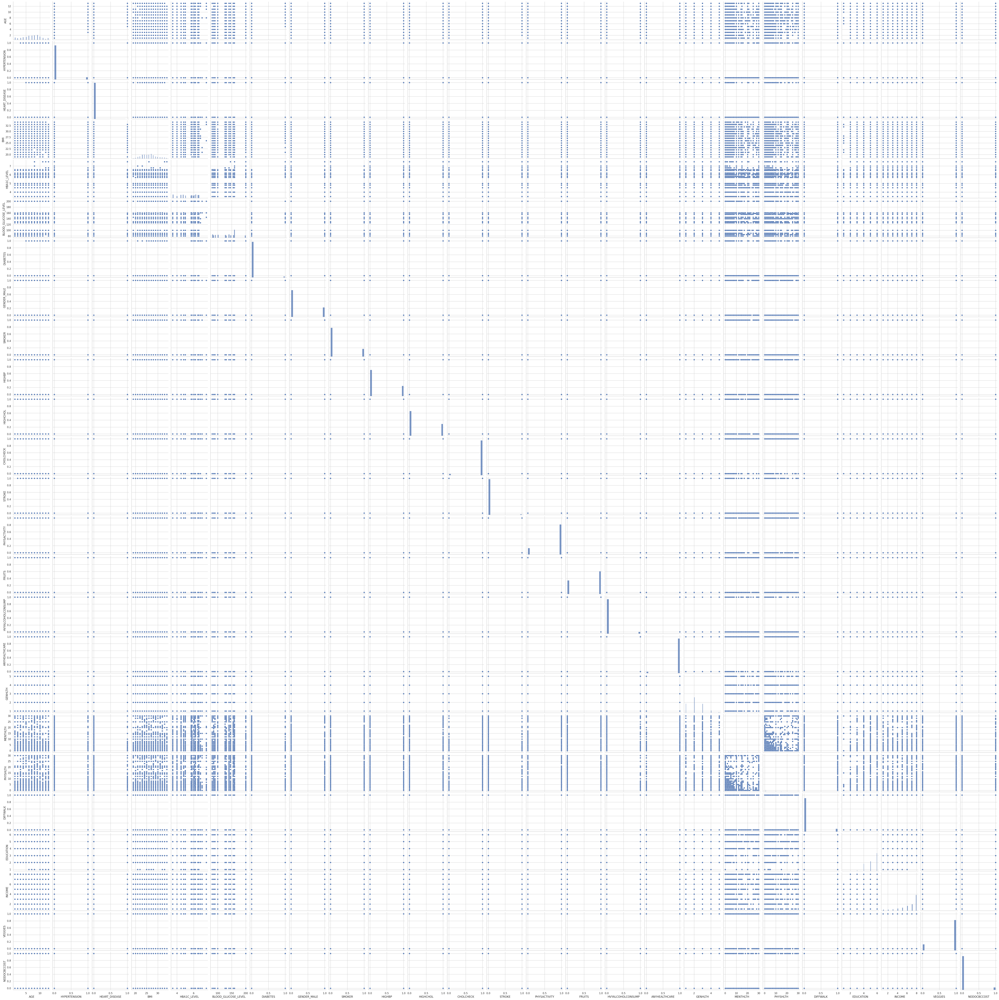

In [ ]:
# Plot pairwise relationships in the dataset
sns.pairplot(data_1_2_3)
plt.show()

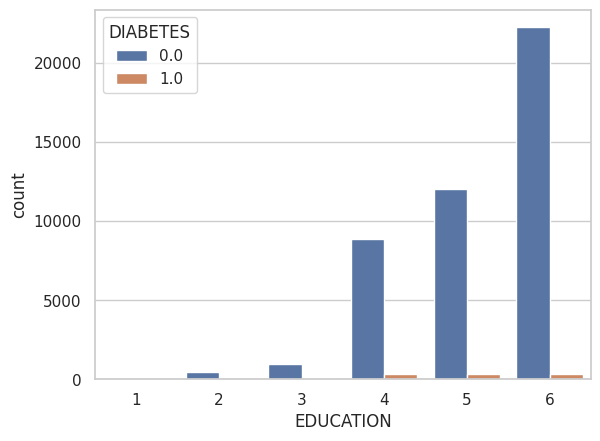

In [ ]:
sns.countplot(x='EDUCATION',hue="DIABETES",data=data_1_2_3);

From Above Graph,Specially seeing the last three bars we Can Conclude that Education Doesn't effect Diabetes beacuse with increase in counts the diabetes persons counts remains constant.

In [ ]:
import plotly.express as px

px.violin(data_1_2_3,
             x='MENTHLTH',
             y='PHYSHLTH',
             title='MENTHLTH Vs PHYSHLTH',
             color='DIABETES')

From above violin plot we can say that Mental health doesn't much effect on diabetes while the physical health have considerable effect on the diabetes.

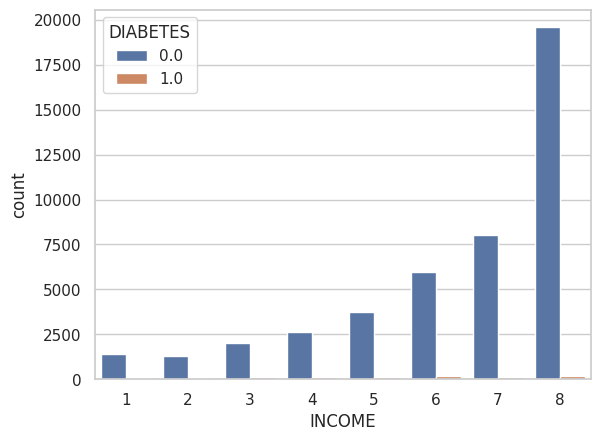

In [ ]:
sns.countplot(x='INCOME',hue='DIABETES',data=data_1_2_3);

From above count plot, it is clear that income doesn't have an effect on diabetes beacuse with increase in income diabetes doesn't increases by a considrable amount.

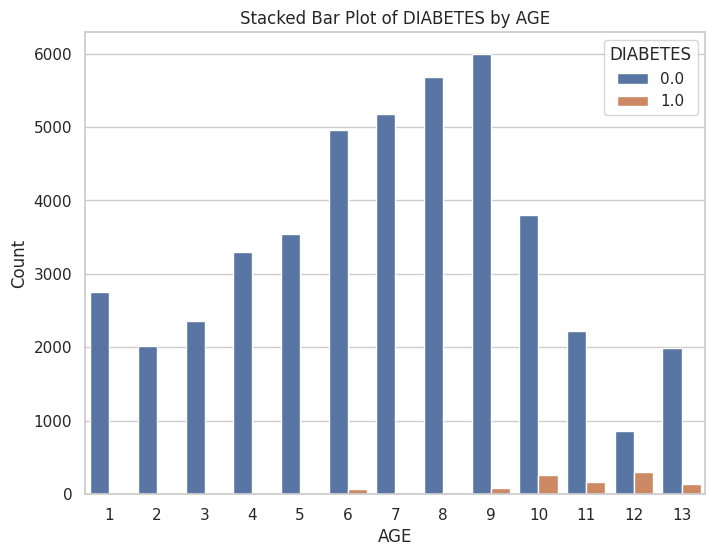

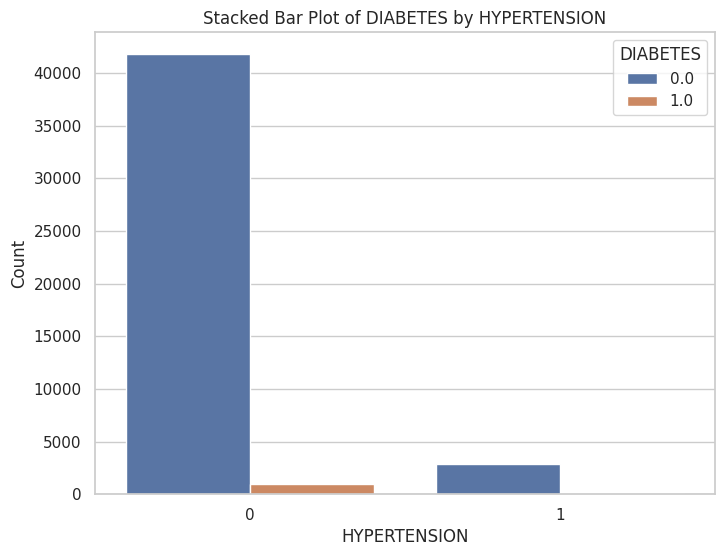

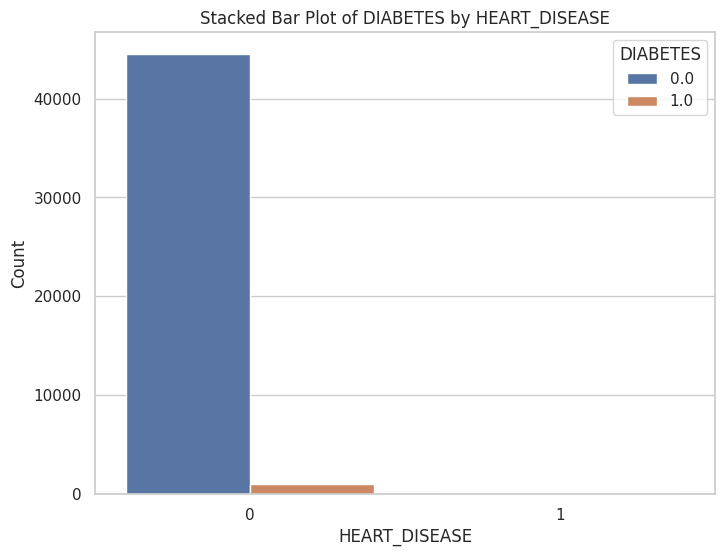

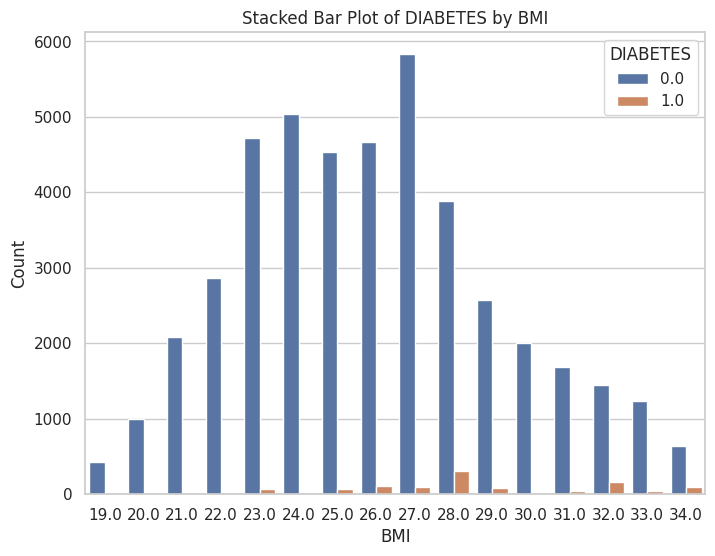

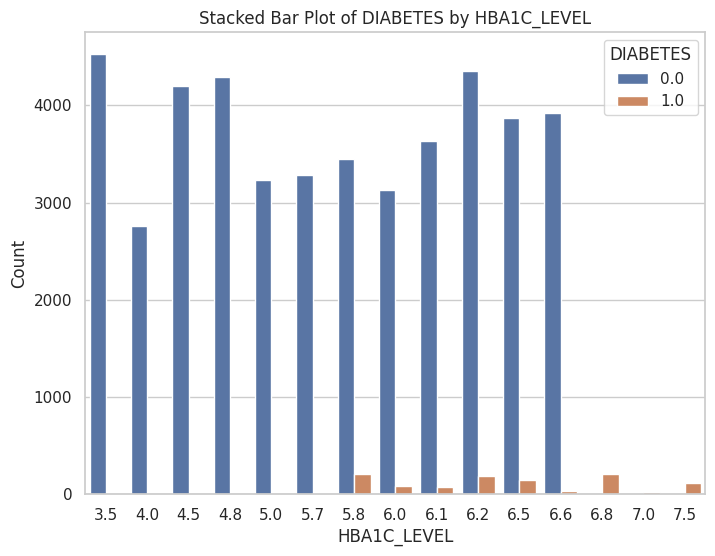

...

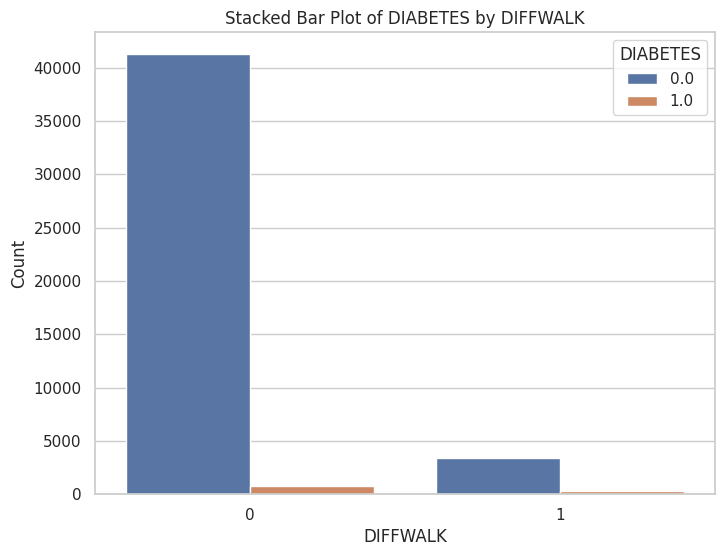

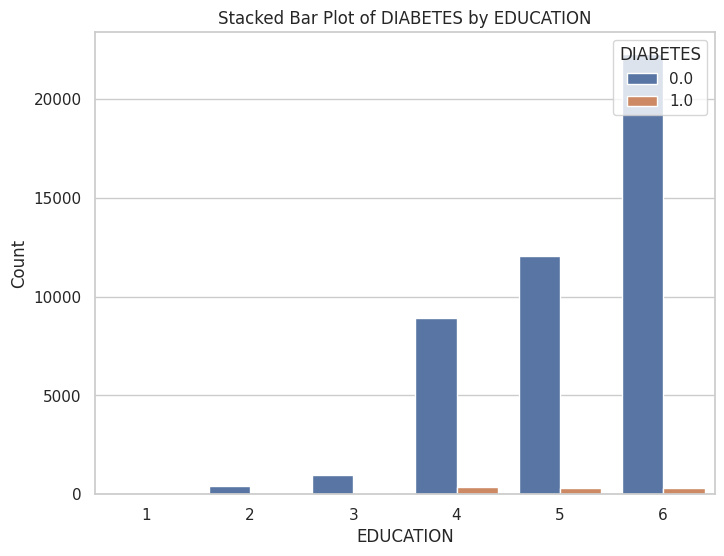

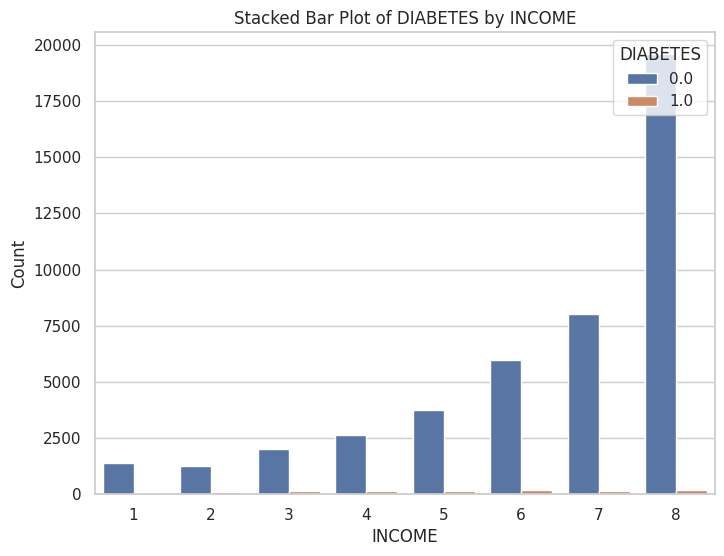

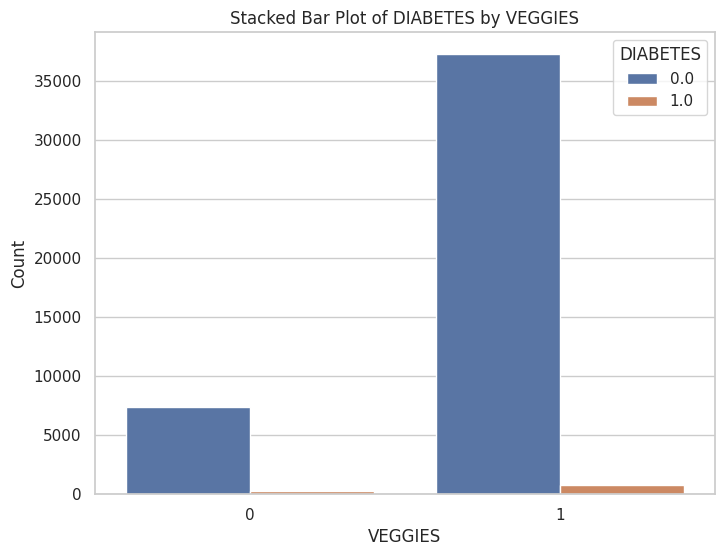

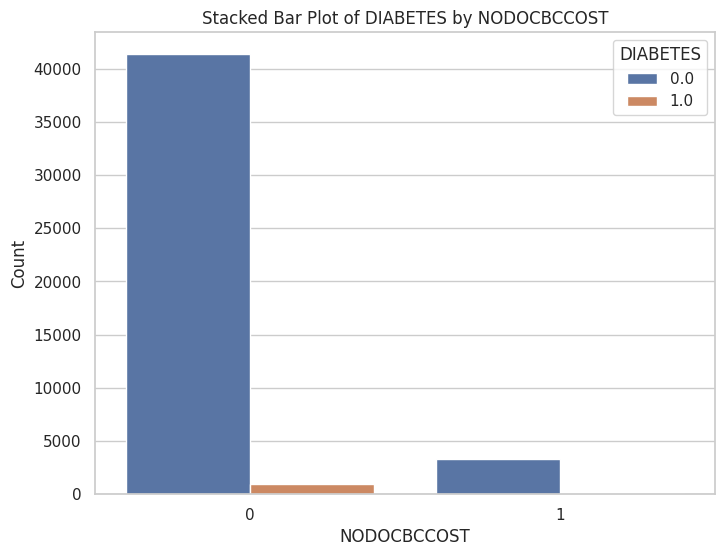

In [ ]:
# Select numerical columns
numerical_columns = data_1_2_3.select_dtypes(include=['int64', 'float64']).columns

# Plot stacked bar plots for each numerical column
for col in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=col, hue='DIABETES', data=data_1_2_3)
    plt.title(f'Stacked Bar Plot of DIABETES by {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.legend(title='DIABETES', loc='upper right')
    plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Step 1: Split the data into training and testing sets
X = data_1_2_3.drop(columns=['DIABETES'])  # Features
y = data_1_2_3['DIABETES']  # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 2: Initialize and train the logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Step 3: Make predictions on the testing data
y_pred = model.predict(X_test)

# Step 4: Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.9766043511533836

Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      8938
         1.0       0.31      0.02      0.04       209

    accuracy                           0.98      9147
   macro avg       0.64      0.51      0.51      9147
weighted avg       0.96      0.98      0.97      9147


Confusion Matrix:
[[8929    9]
 [ 205    4]]


In [ ]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.linear_model import LogisticRegression

# Oversample the minority class
oversampler = RandomOverSampler(random_state=42)
X_resampled_over, y_resampled_over = oversampler.fit_resample(X_train, y_train)

# Undersample the majority class
undersampler = RandomUnderSampler(random_state=42)
X_resampled_under, y_resampled_under = undersampler.fit_resample(X_train, y_train)

# Use class weights with logistic regression
log_reg = LogisticRegression(class_weight='balanced', random_state=42)

# Fit logistic regression on oversampled data
log_reg.fit(X_resampled_over, y_resampled_over)

# Fit logistic regression on undersampled data
log_reg.fit(X_resampled_under, y_resampled_under)

# Predict on the test data
y_pred = log_reg.predict(X_test)

# Evaluate the performance
print("Accuracy:", accuracy_score(y_test, y_pred))

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix

print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1-score:", f1_score(y_test, y_pred))

# Generate classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Generate confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Accuracy: 0.8073685361320652
Precision: 0.09536216779572694
Recall: 0.8755980861244019
F1-score: 0.17199248120300753

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.81      0.89      8938
         1.0       0.10      0.88      0.17       209

    accuracy                           0.81      9147
   macro avg       0.55      0.84      0.53      9147
weighted avg       0.98      0.81      0.87      9147


Confusion Matrix:
[[7202 1736]
 [  26  183]]


In [ ]:
threshold = 0.3  # Example threshold value
y_pred_proba = log_reg.predict_proba(X_test)[:, 1]  # Predicted probabilities for class 1
y_pred_threshold = (y_pred_proba >= threshold).astype(int)  # Convert probabilities to binary predictions

# Evaluate the performance with adjusted threshold
print("Adjusted Threshold:")
print("Accuracy:", accuracy_score(y_test, y_pred_threshold))
print("Precision:", precision_score(y_test, y_pred_threshold))
print("Recall:", recall_score(y_test, y_pred_threshold))
print("F1-score:", f1_score(y_test, y_pred_threshold))

Adjusted Threshold:
Accuracy: 0.711380780583798
Precision: 0.06942968473255402
Recall: 0.937799043062201
F1-score: 0.12928759894459105


In [ ]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation
cv_scores = cross_val_score(log_reg, X_train, y_train, cv=5)

# Print cross-validation scores
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

Cross-Validation Scores: [0.83449501 0.82506492 0.83012163 0.81891486 0.81508815]
Mean CV Accuracy: 0.824736914035807


In [ ]:
from sklearn.model_selection import GridSearchCV

# Define hyperparameters to tune
param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}

# Instantiate GridSearchCV
grid_search = GridSearchCV(log_reg, param_grid, cv=5, scoring='accuracy')

# Fit grid search to the data
grid_search.fit(X_train, y_train)

# Print best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

Best Hyperparameters: {'C': 1}


In [ ]:
from imblearn.over_sampling import SMOTE

# Instantiate SMOTE
smote = SMOTE(random_state=42)

# Oversample the minority class
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [ ]:
# Train the model with best hyperparameters
best_log_reg = LogisticRegression(C=1, class_weight='balanced', random_state=42)
best_log_reg.fit(X_train_resampled, y_train_resampled)

LogisticRegression(C=1, class_weight='balanced', random_state=42)

In [ ]:
# Predict on the test data
y_pred_test = best_log_reg.predict(X_test)

# Evaluate the performance on test data
print("Test Accuracy:", accuracy_score(y_test, y_pred_test))
print("Test Precision:", precision_score(y_test, y_pred_test))
print("Test Recall:", recall_score(y_test, y_pred_test))
print("Test F1-score:", f1_score(y_test, y_pred_test))

Test Accuracy: 0.8571116212966
Test Precision: 0.11118980169971672
Test Recall: 0.7511961722488039
Test F1-score: 0.19370758790869833


In [ ]:
y_pred = model.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[8927   11]
 [ 207    2]]


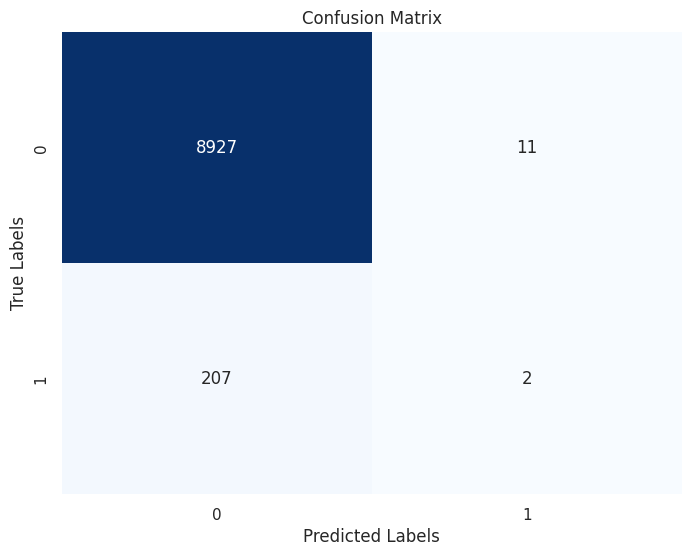

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
from sklearn.metrics import classification_report

print("Classification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      8938
         1.0       0.15      0.01      0.02       209

    accuracy                           0.98      9147
   macro avg       0.57      0.50      0.50      9147
weighted avg       0.96      0.98      0.97      9147



In [ ]:
# Get indices of misclassified samples
misclassified_idx = (y_test != y_pred)

# Display misclassified samples
misclassified_samples = X_test[misclassified_idx]
print("Misclassified Samples:")
print(misclassified_samples)

Misclassified Samples:
       AGE  HYPERTENSION  HEART_DISEASE   BMI  HBA1C_LEVEL  \
4210    10             0              0  34.0          6.5   
20579    6             0              0  30.0          6.0   
35926    9             0              0  23.0          5.8   
14652   10             0              0  28.0          5.8   
46899   13             1              0  31.0          6.8   
...    ...           ...            ...   ...          ...   
47790   13             0              0  25.0          6.0   
5125    10             0              0  28.0          6.2   
5169    10             0              0  28.0          6.2   
4264    10             0              0  34.0          6.5   
1777    13             0              1  26.0          7.5   

       BLOOD_GLUCOSE_LEVEL  GENDER_MALE  SMOKER  HIGHBP  HIGHCHOL  ...  \
4210                   145            1       1       1         0  ...   
20579                  140            0       0       0         0  ...   
35926     